In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls /content/drive/My\Drive\/Grupo3SDR/

11b11M_2024-07-01T19_57_14_400.wav  11g6M_2024-07-01T19_58_56_230.wav
11b1M_2024-07-01T19_55_30_032.wav   11g9M_2024-07-01T19_59_21_616.wav
11b2M_2024-07-01T19_56_09_646.wav   11nMsc2_2024-07-01T20_03_43_434.wav
11g12M_2024-07-01T20_00_05_117.wav  11nMsc3_2024-07-01T20_04_06_214.wav
11g18M_2024-07-01T20_00_33_222.wav  11nMsc4_2024-07-01T20_04_26_693.wav
11g24M_2024-07-01T20_00_57_835.wav  11nMsc5_2024-07-01T20_04_47_311.wav
11g36M_2024-07-01T20_01_24_785.wav  11nMsc6_2024-07-01T20_05_18_193.wav
11g48M_2024-07-01T20_01_53_893.wav  11nMsc7_2024-07-01T20_05_37_719.wav
11g54M_2024-07-01T20_02_16_410.wav  ruido_2024-07-01T19_57_41_066.wav


## Espectrogramas de señales 802.11b

<ipython-input-3-f6a7d4632660>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


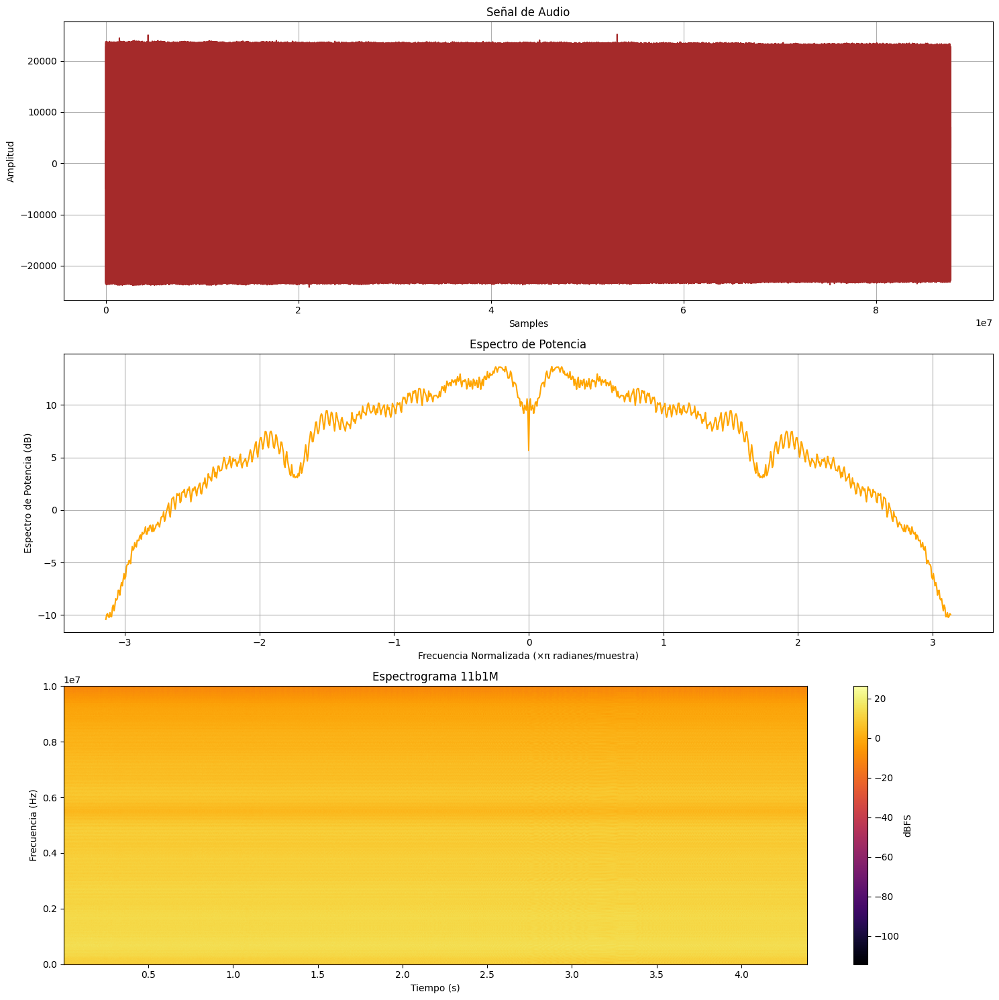

In [3]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11b1M_2024-07-01T19_55_30_032.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b1M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-5-b932697165bf>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


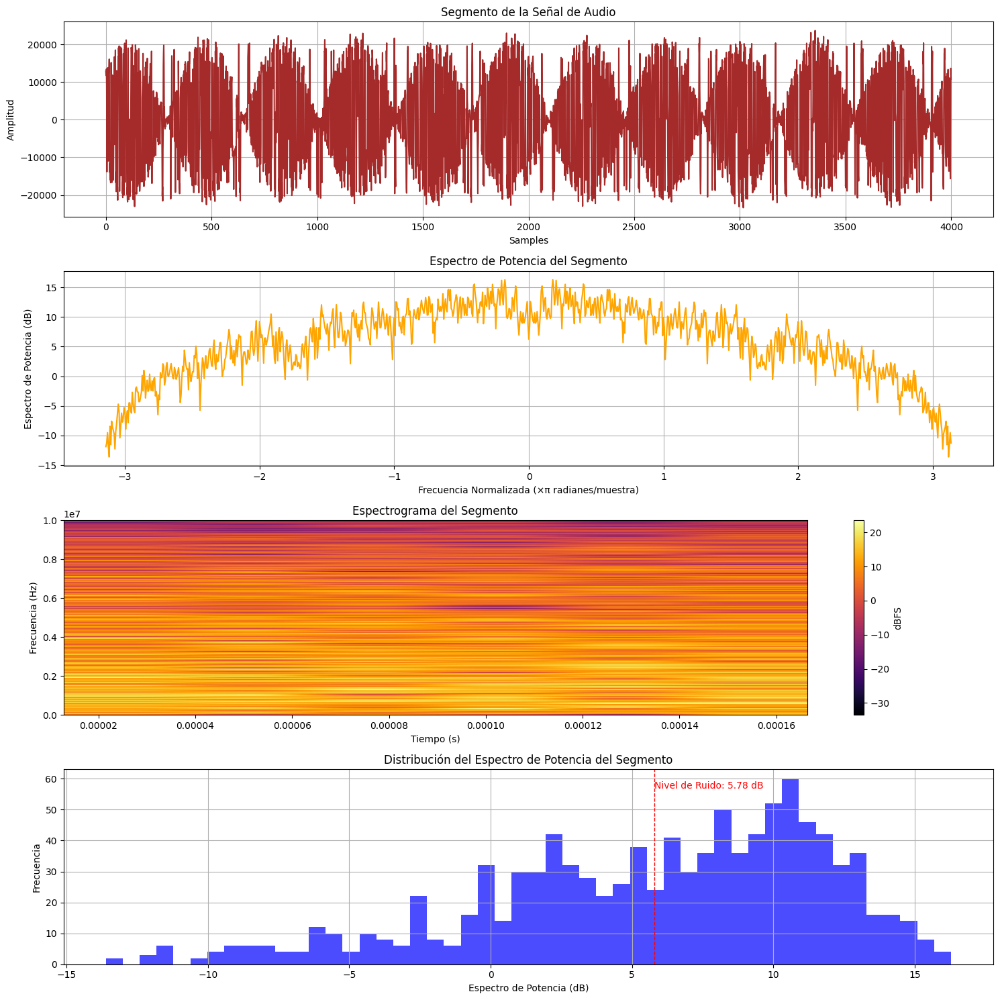

In [5]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11b1M_2024-07-01T19_55_30_032.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-4-9716ff4bd881>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


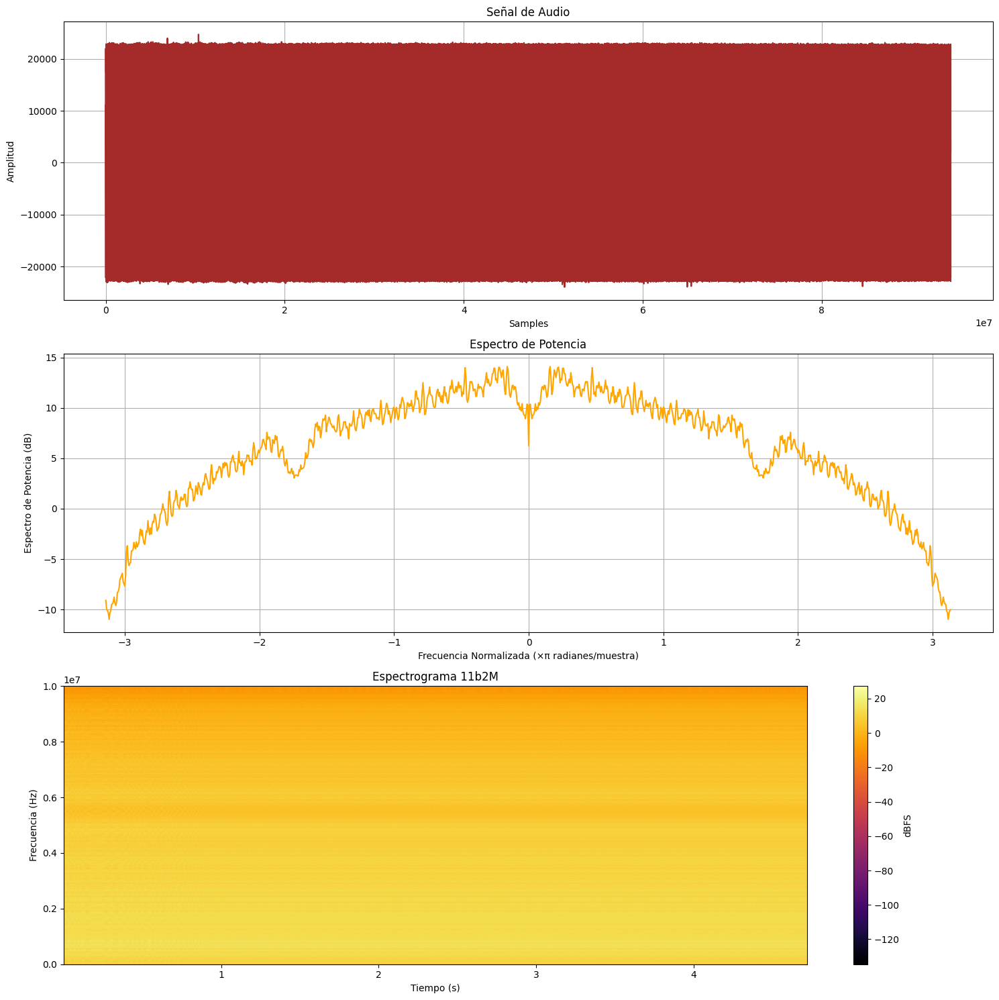

In [4]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11b2M_2024-07-01T19_56_09_646.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b2M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-6-0c7001738607>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


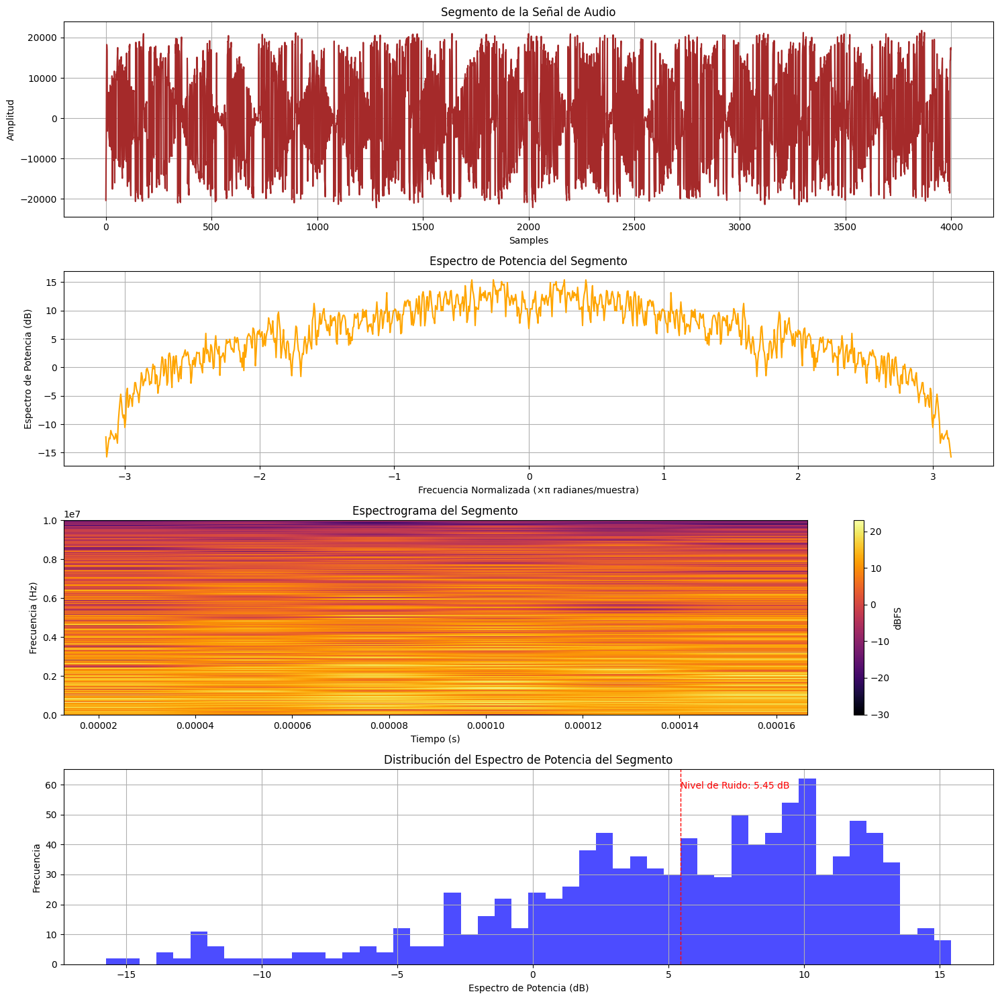

In [6]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11b2M_2024-07-01T19_56_09_646.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-7-3ff7740f2bc7>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


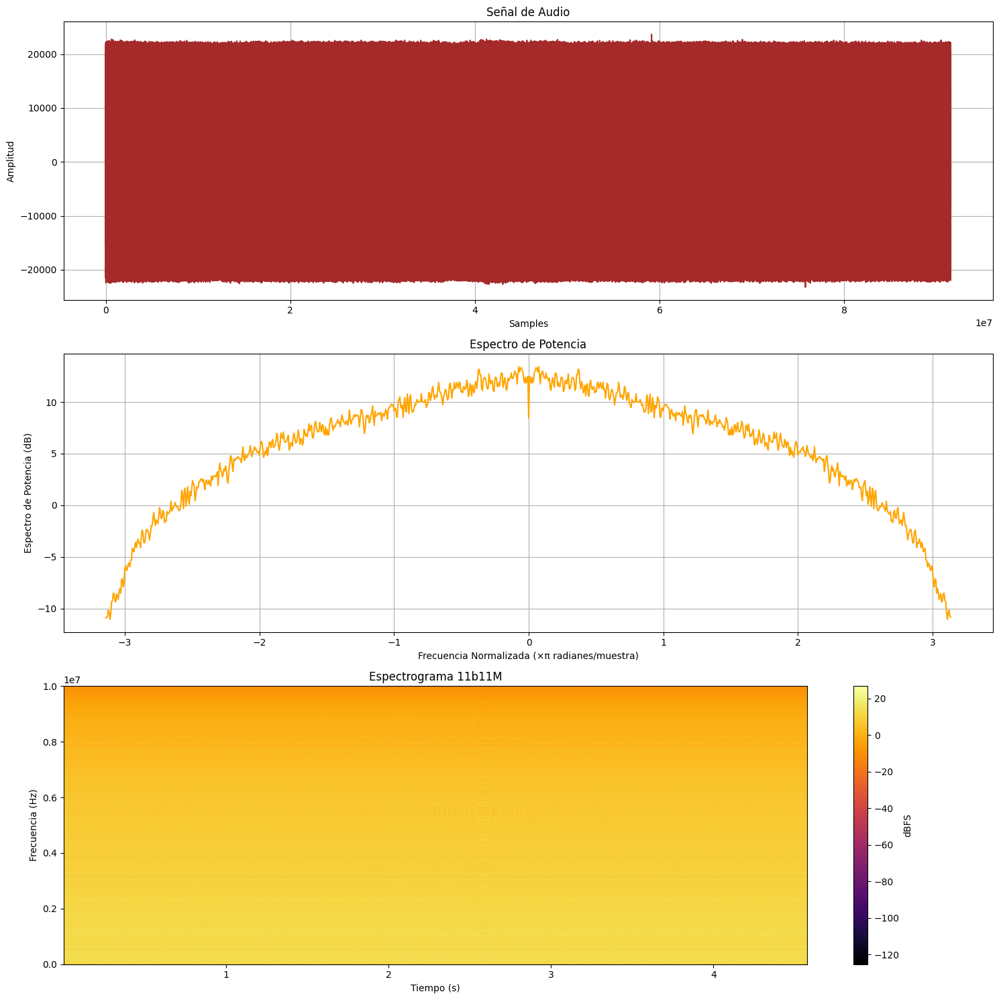

In [7]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11b11M_2024-07-01T19_57_14_400.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b11M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-8-dcd16c6e1983>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


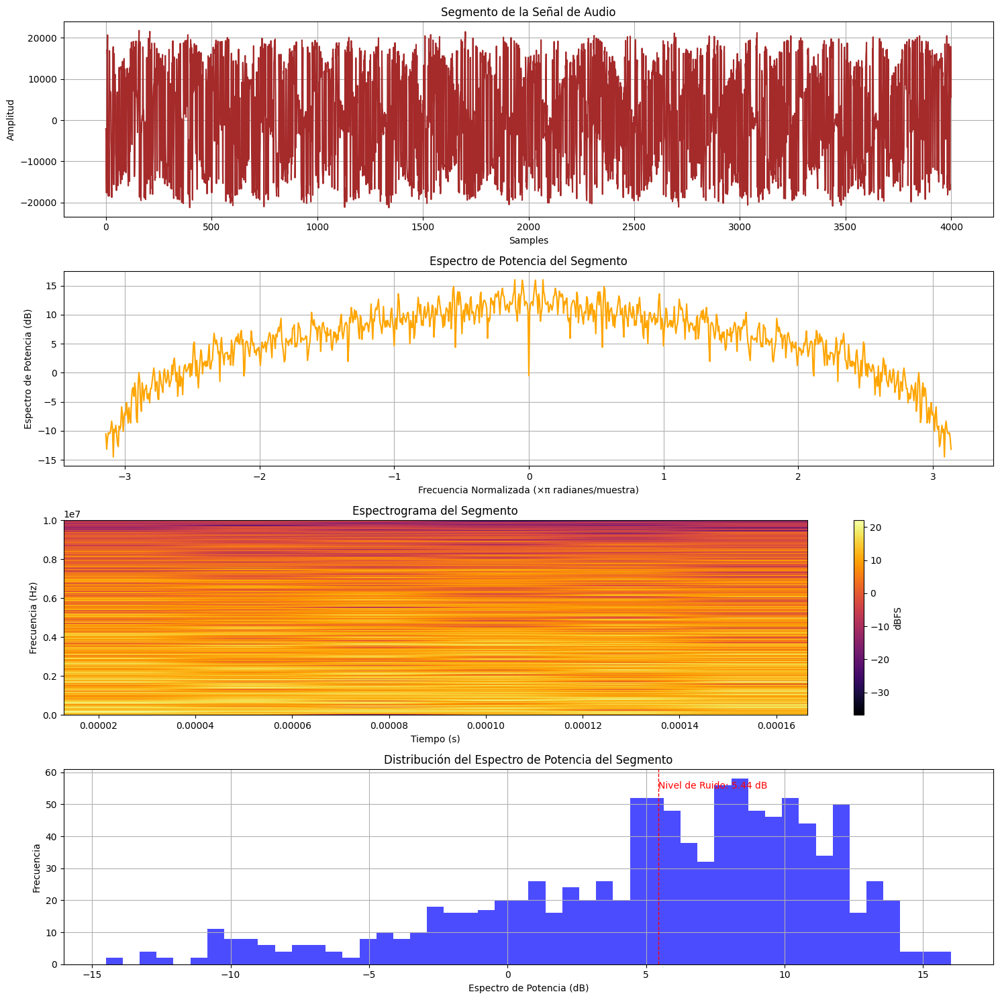

In [8]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11b11M_2024-07-01T19_57_14_400.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señal de ruido

<ipython-input-9-5ca8fe6a2ed0>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


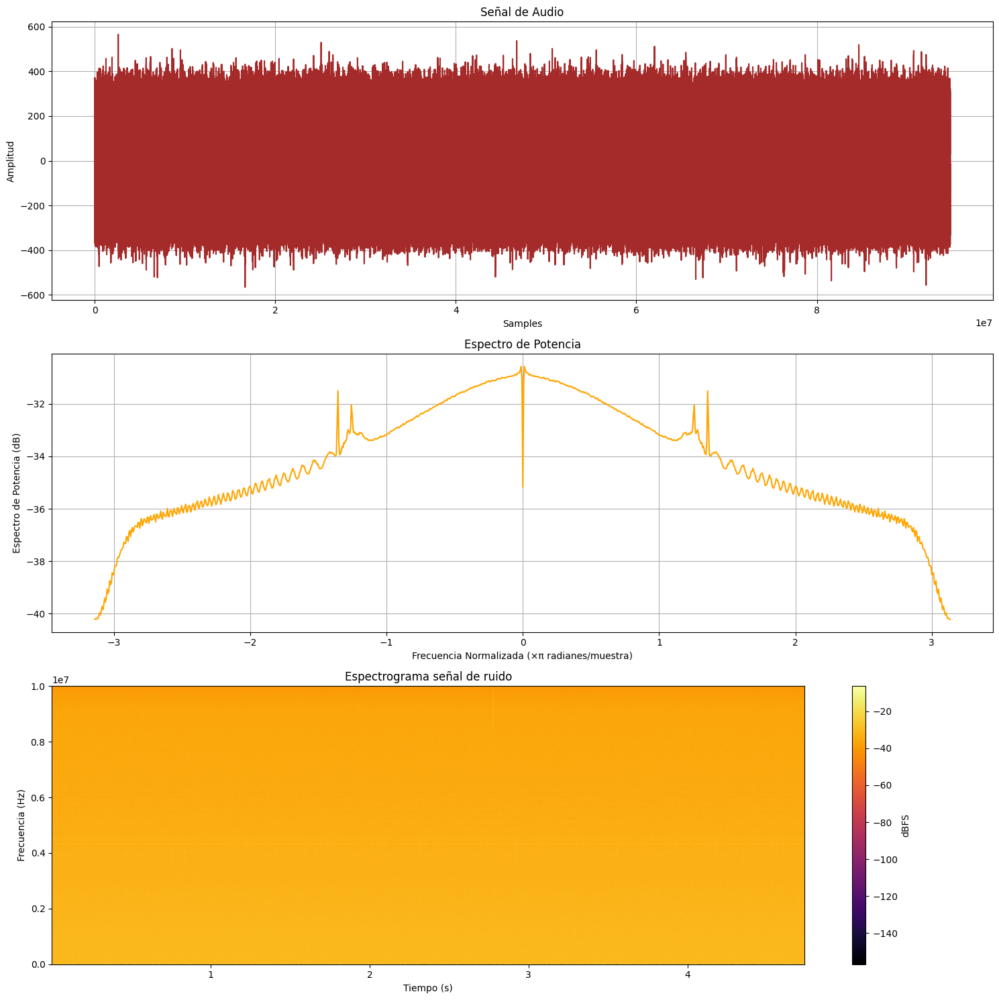

In [9]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/ruido_2024-07-01T19_57_41_066.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma señal de ruido')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-10-ef81372400b4>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


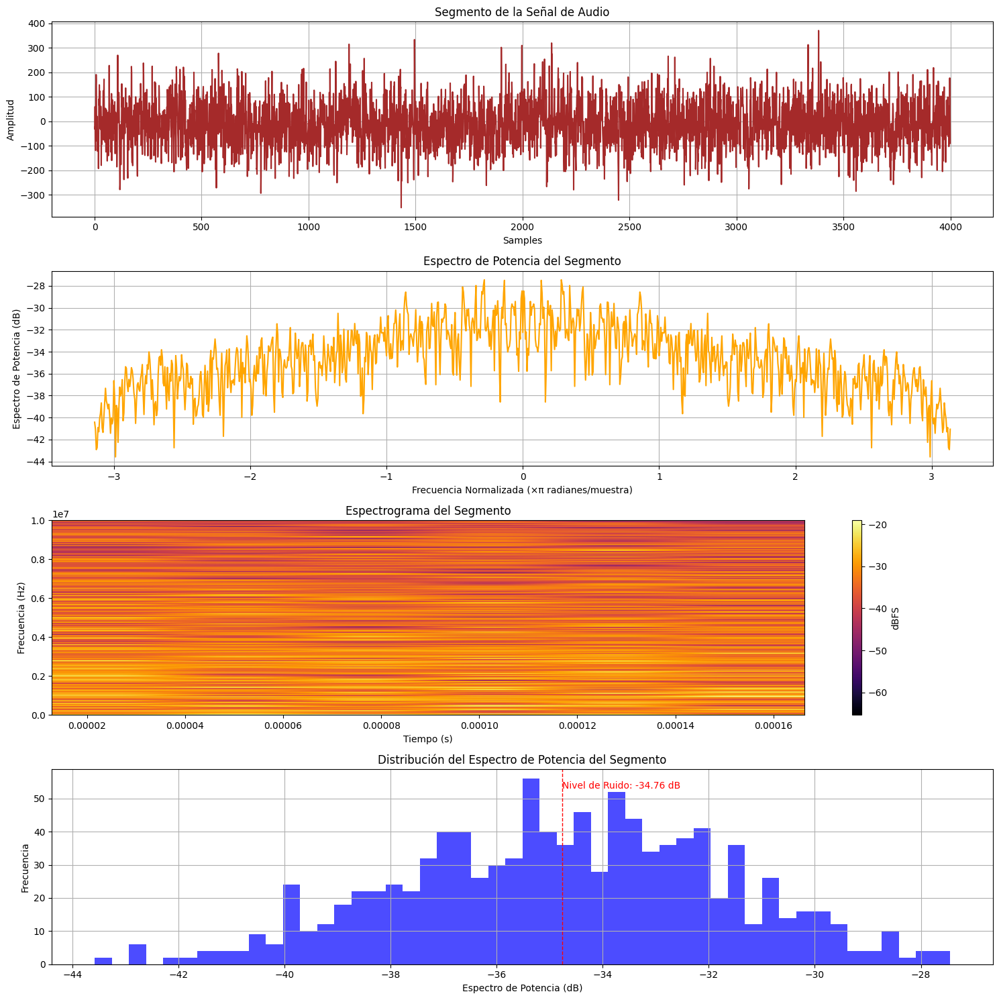

In [10]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/ruido_2024-07-01T19_57_41_066.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11n

<ipython-input-11-083d0c664f67>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


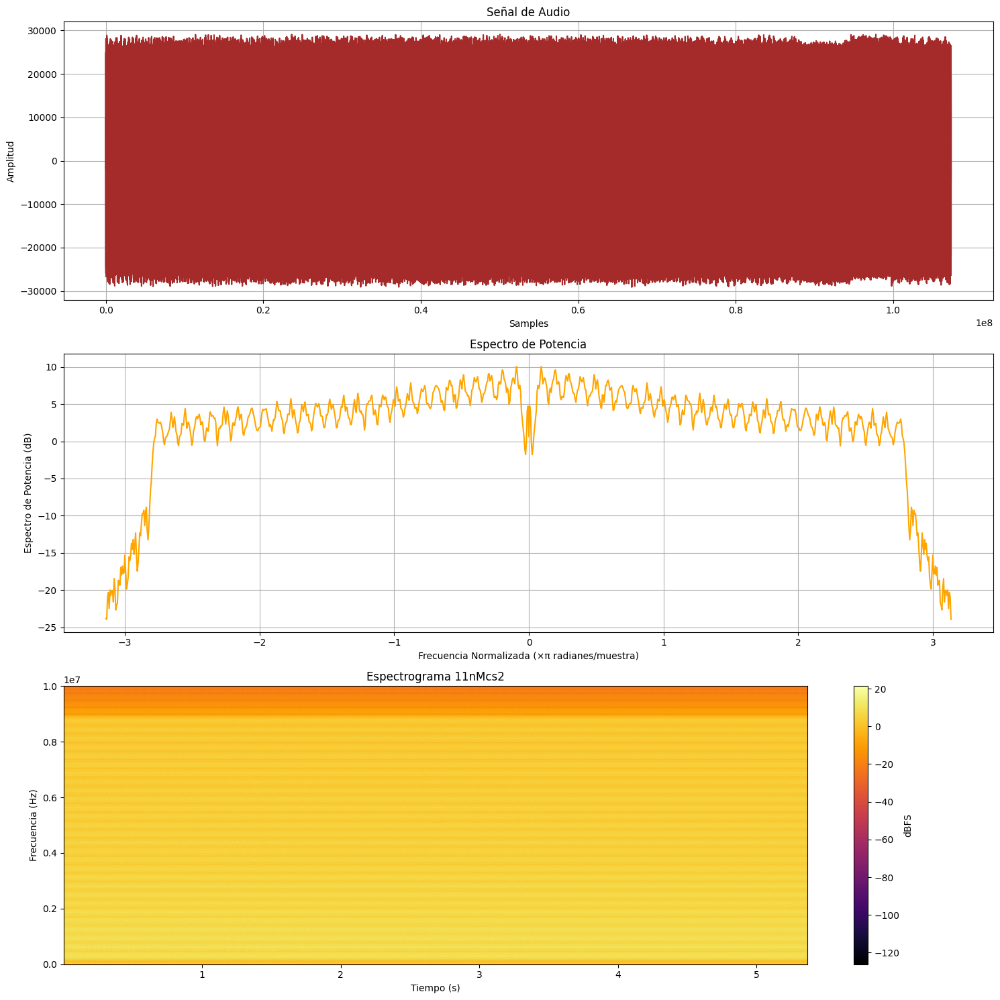

In [11]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc2_2024-07-01T20_03_43_434.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs2')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-12-50f53c5e691b>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


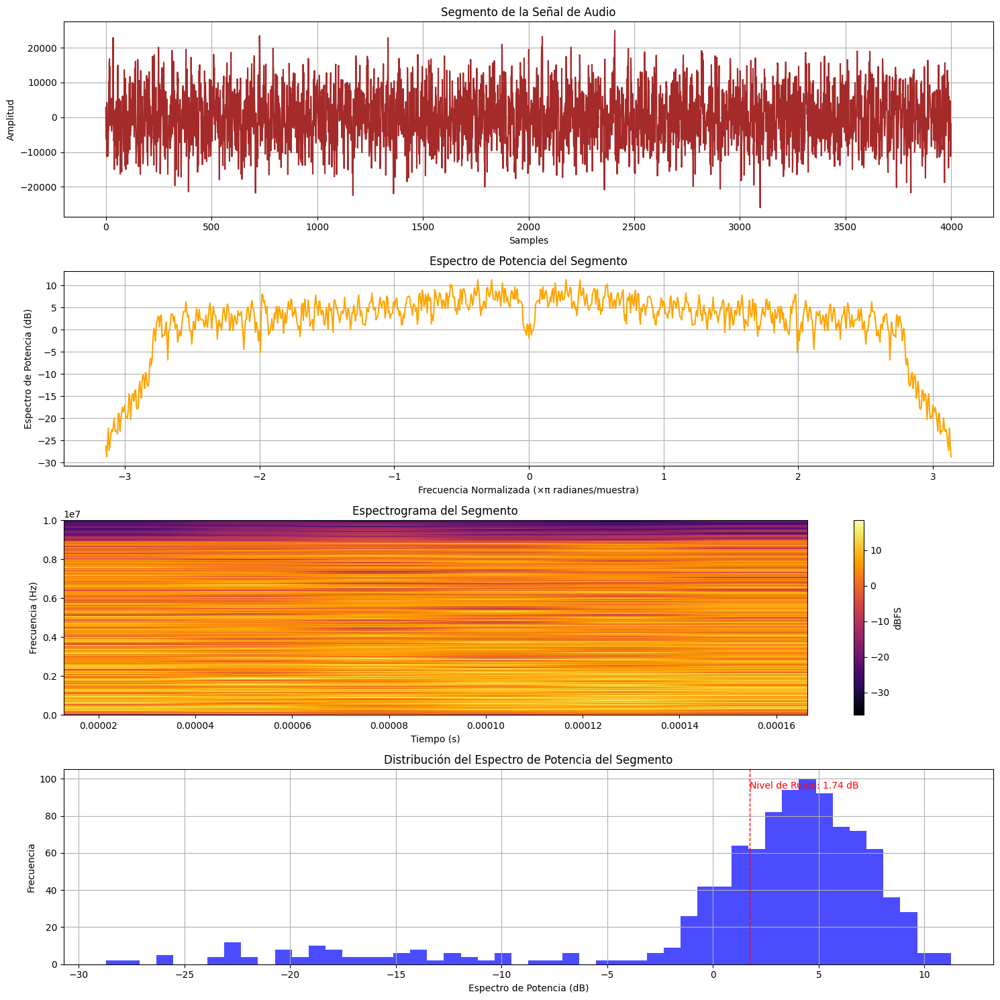

In [12]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc2_2024-07-01T20_03_43_434.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-13-ccde490b7634>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


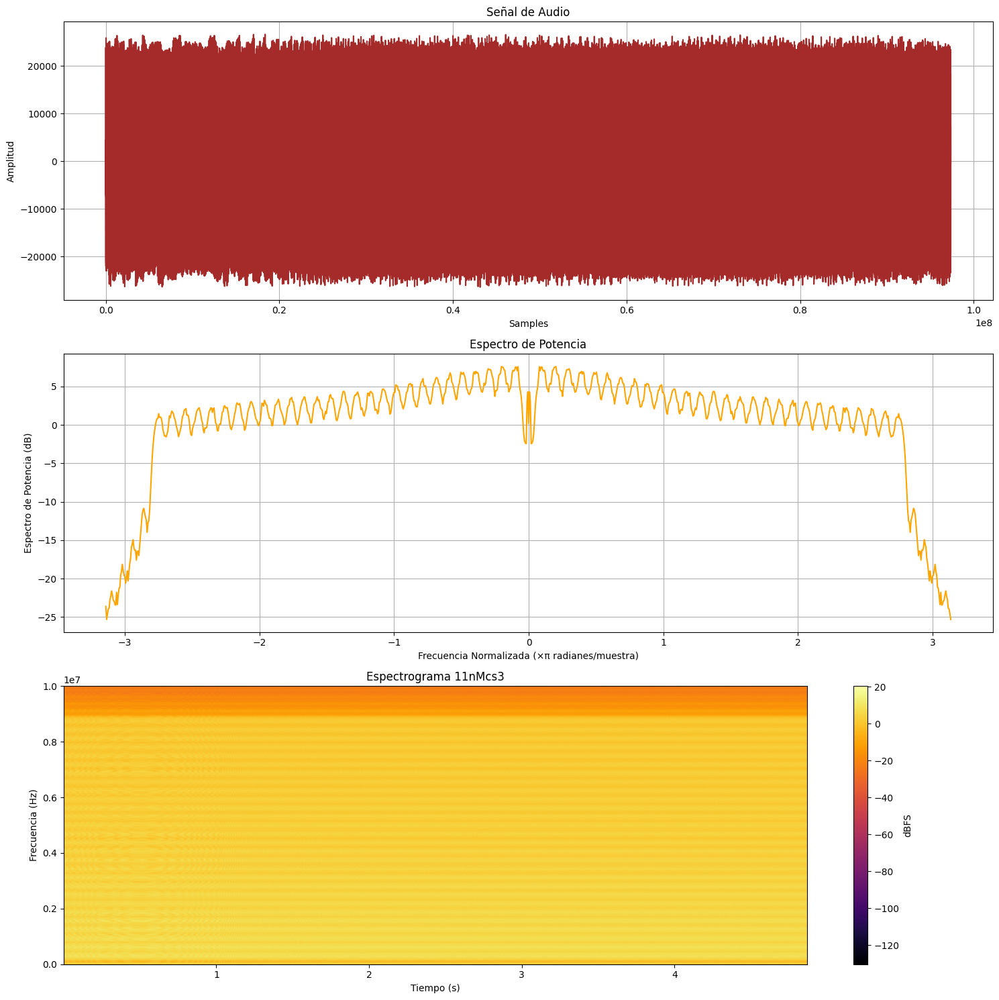

In [13]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc3_2024-07-01T20_04_06_214.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs3')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-14-b40702731f85>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


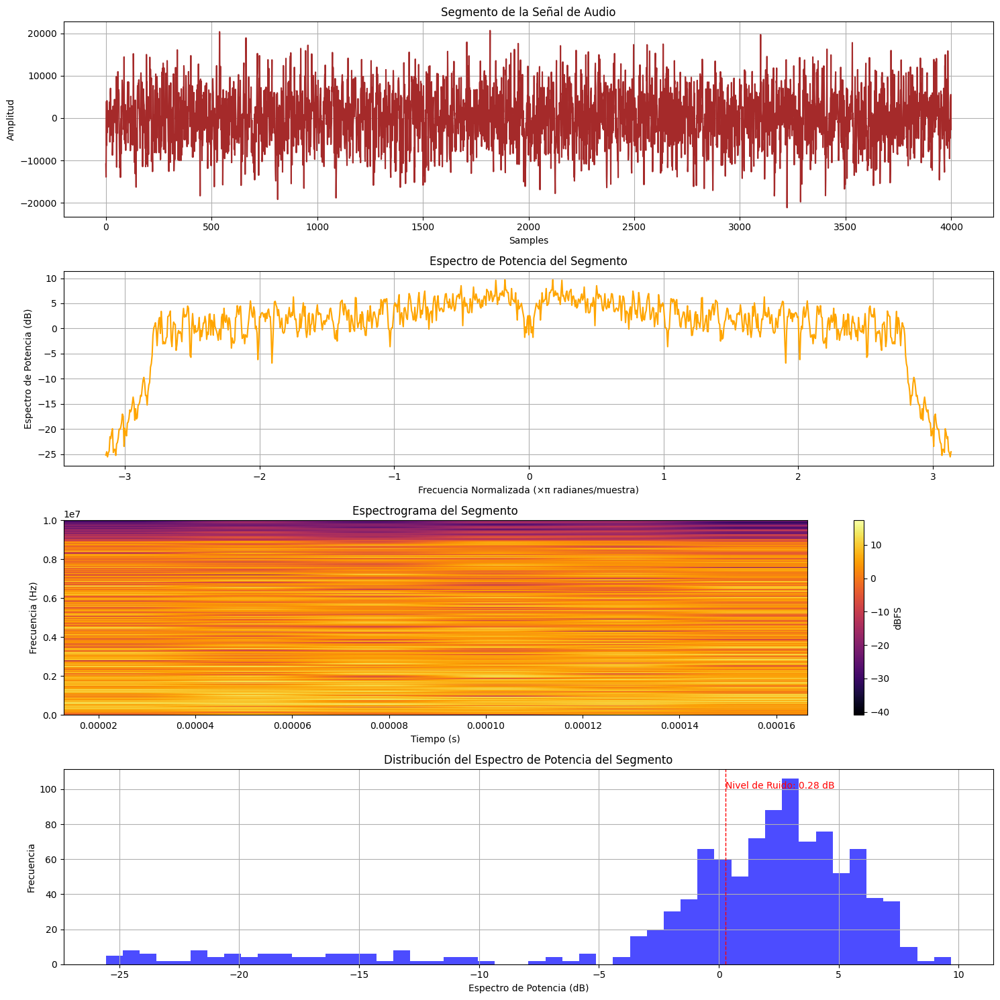

In [14]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc3_2024-07-01T20_04_06_214.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-15-42f2577875e6>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


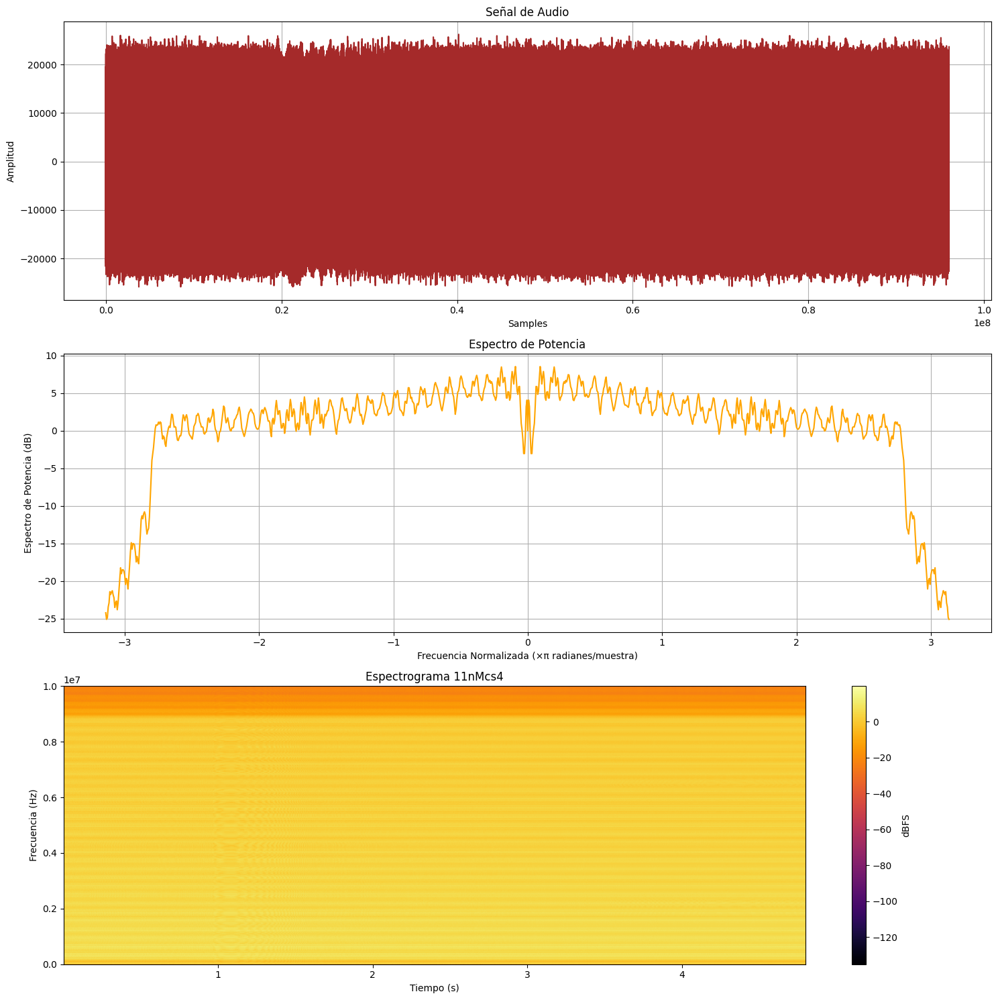

In [15]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc4_2024-07-01T20_04_26_693.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs4')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-16-da9a8facab1f>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


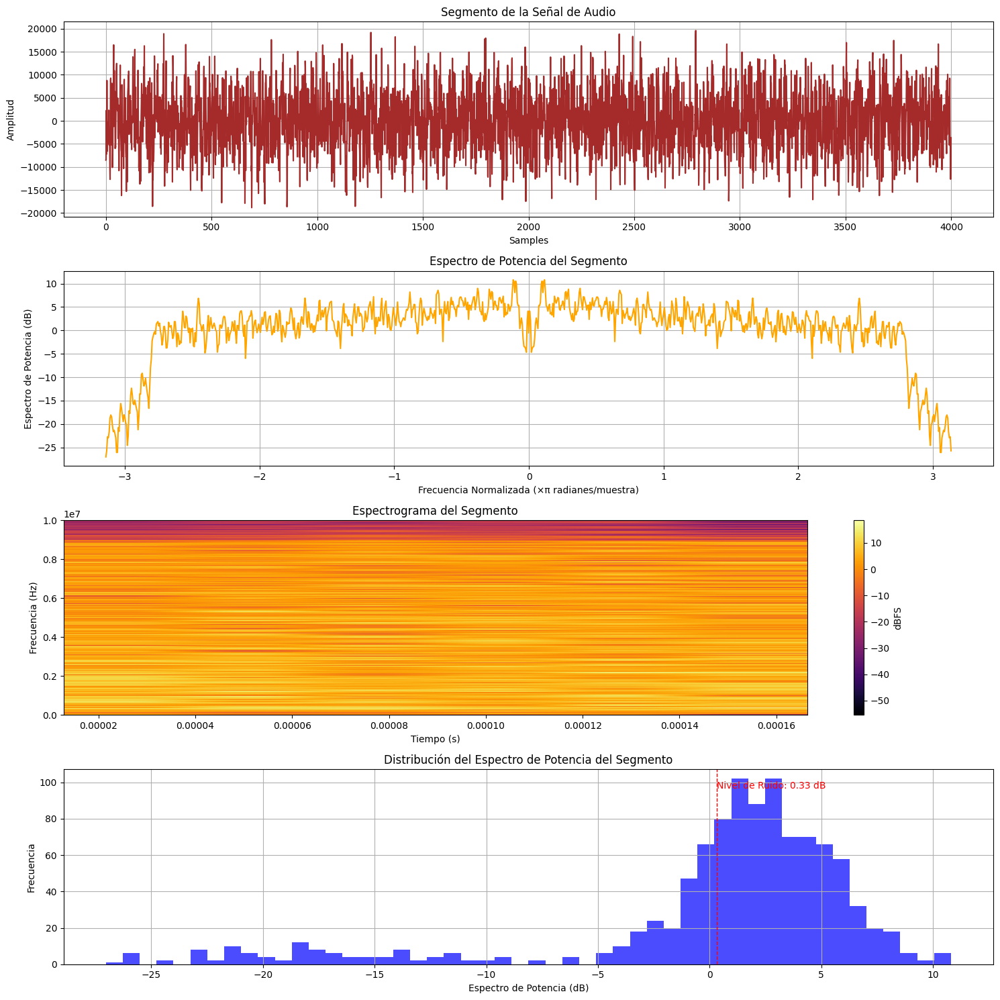

In [16]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc4_2024-07-01T20_04_26_693.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-17-354fe0411c6a>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


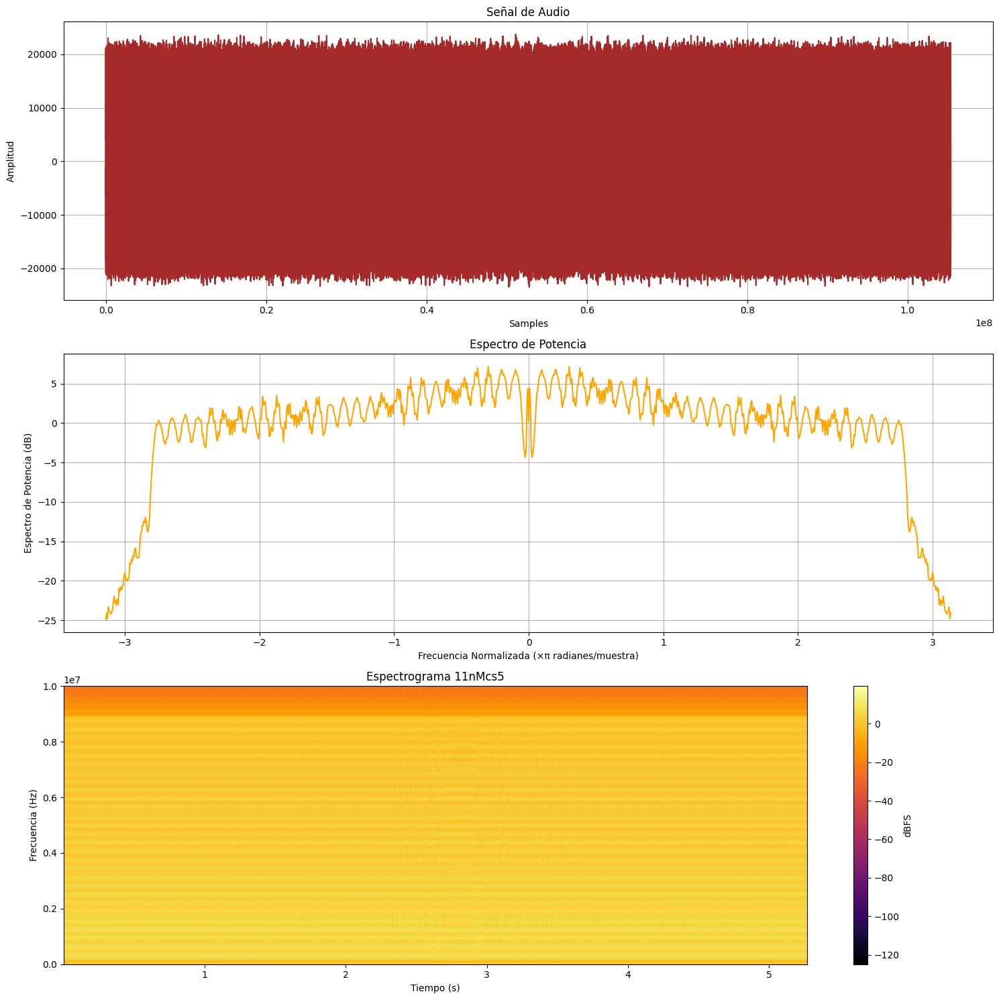

In [17]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc5_2024-07-01T20_04_47_311.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs5')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-18-5c24807b8693>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


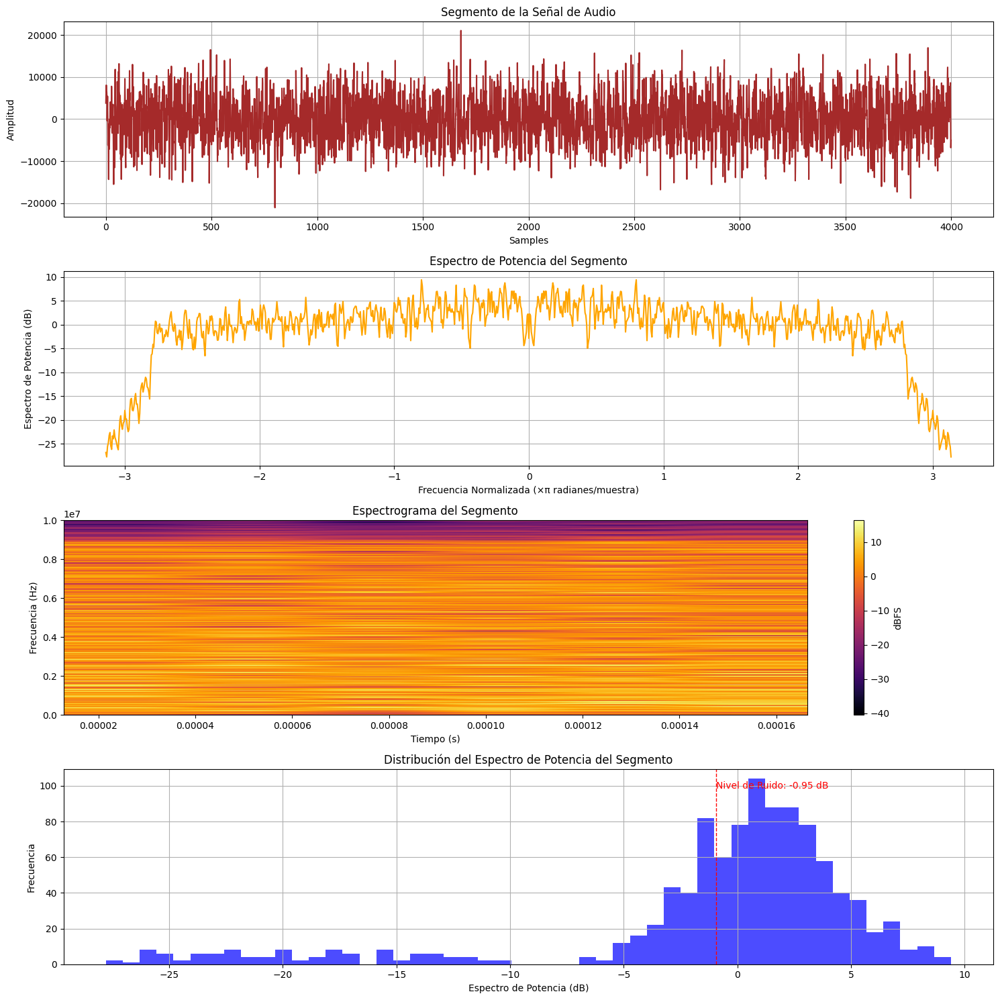

In [18]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc5_2024-07-01T20_04_47_311.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-19-387f6c923a8c>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


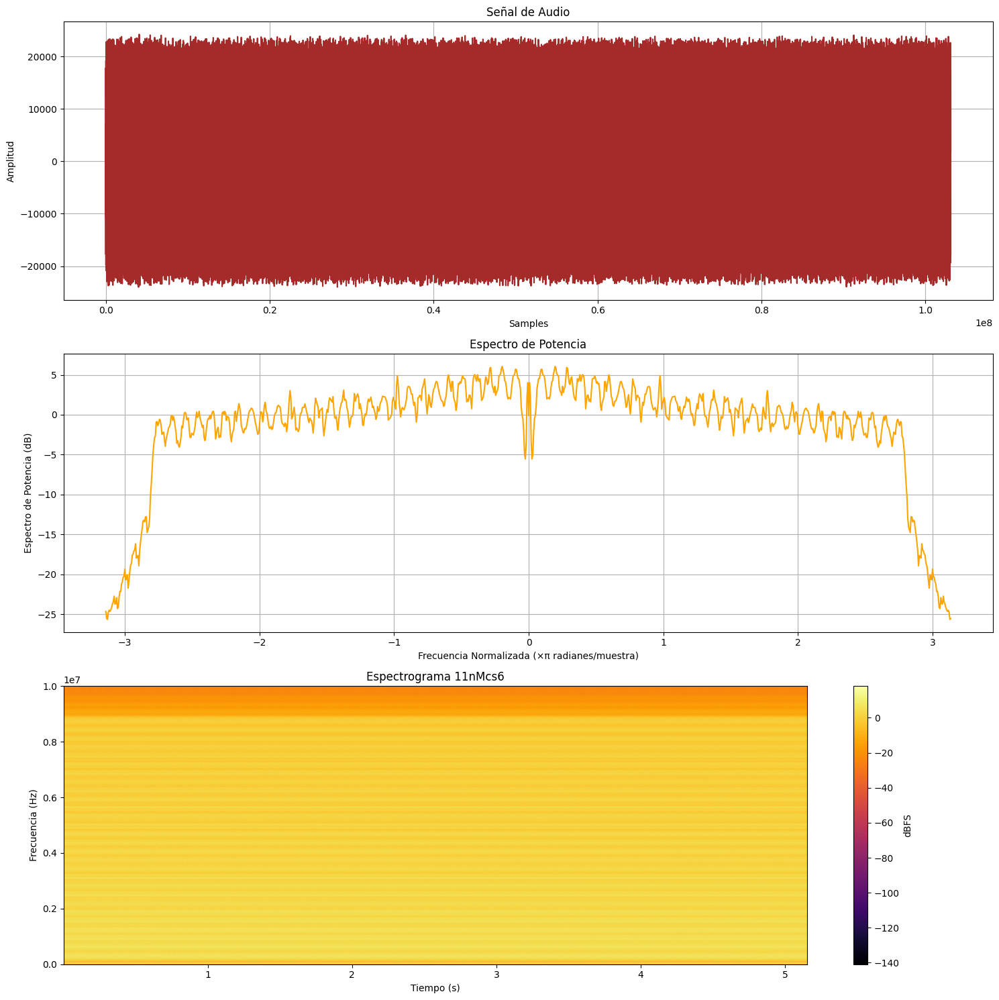

In [19]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc6_2024-07-01T20_05_18_193.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs6' )
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-20-61bbaae380c6>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


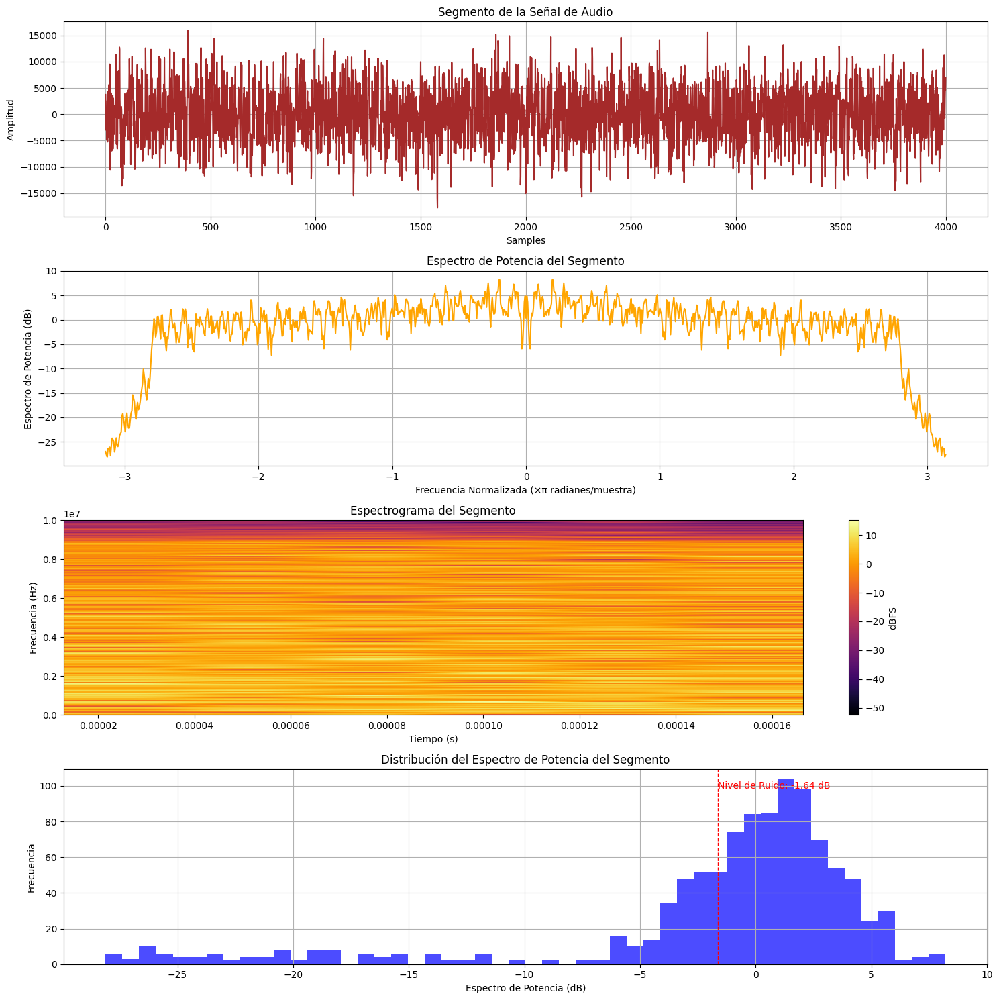

In [20]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc6_2024-07-01T20_05_18_193.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-21-7de53465e908>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


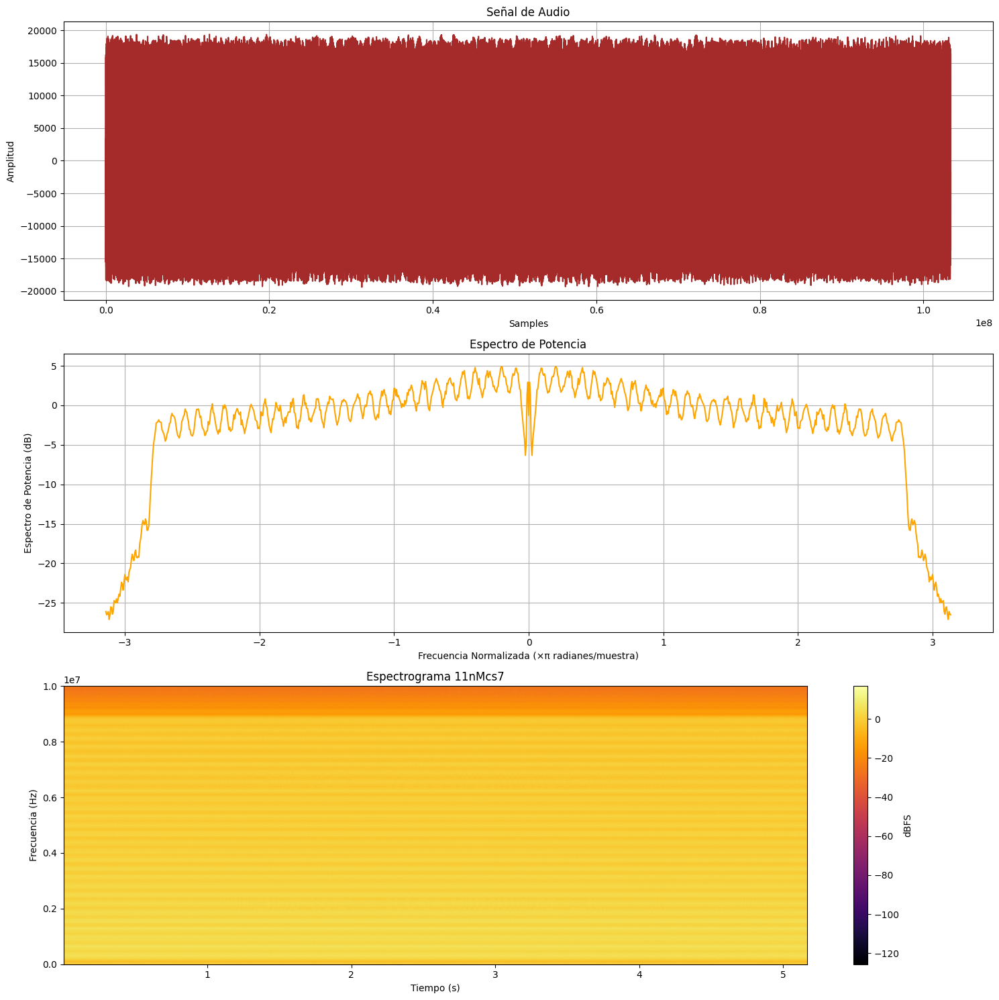

In [21]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc7_2024-07-01T20_05_37_719.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs7')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-22-a9d560f2d873>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


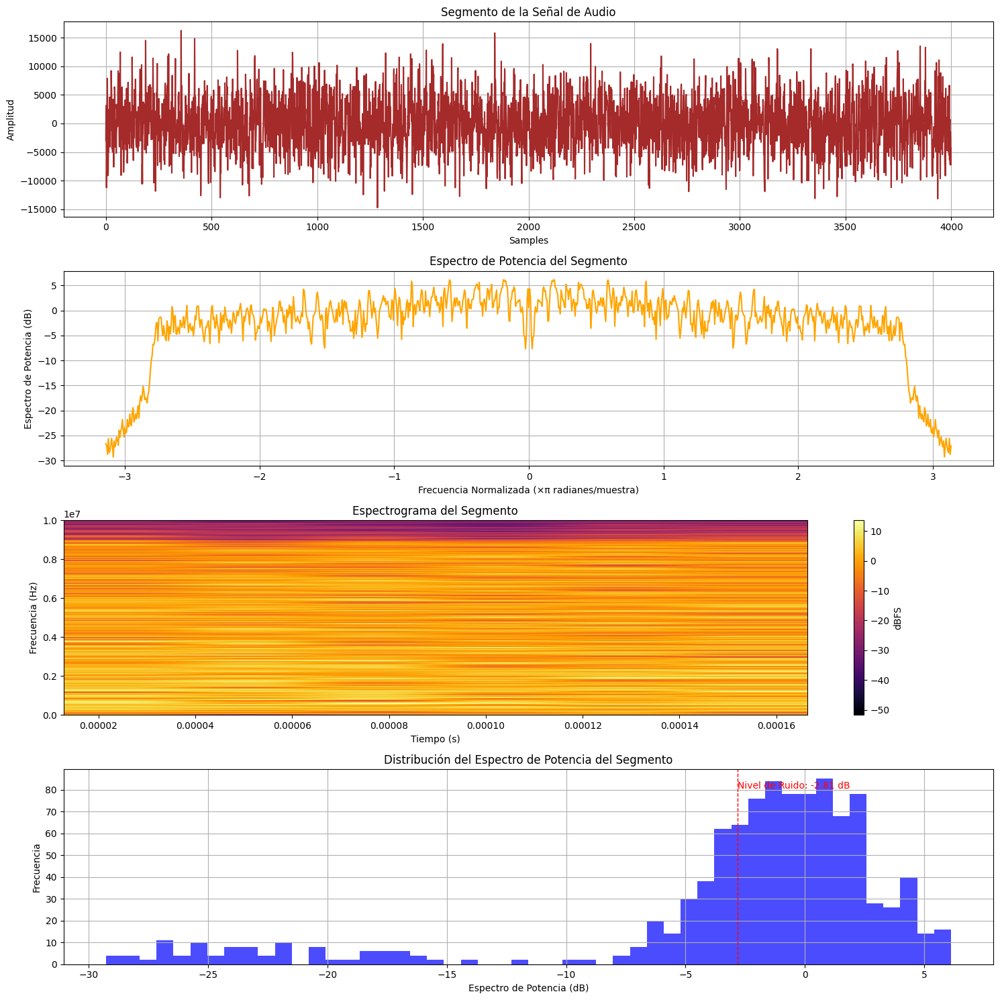

In [22]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11nMsc7_2024-07-01T20_05_37_719.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11g

<ipython-input-23-ce80b0a5f95f>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


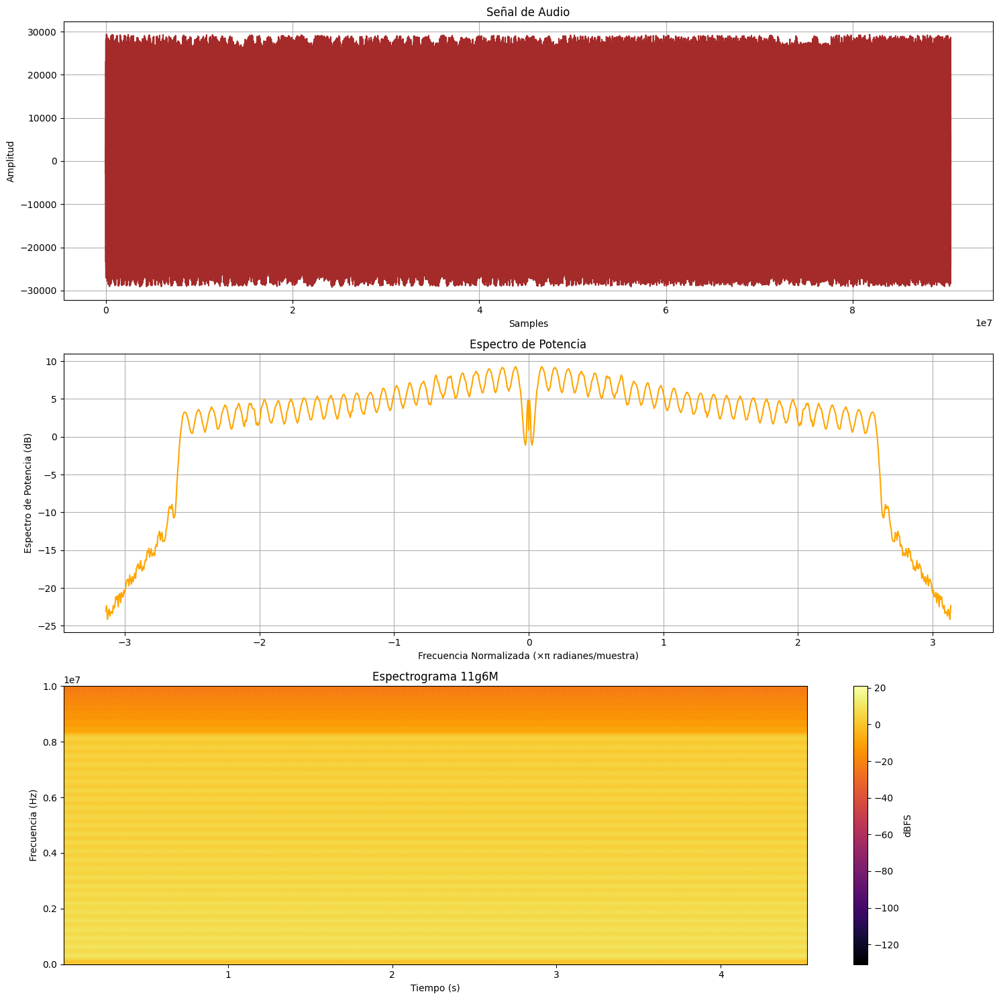

In [23]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g6M_2024-07-01T19_58_56_230.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g6M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-24-4e028ba40a1c>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


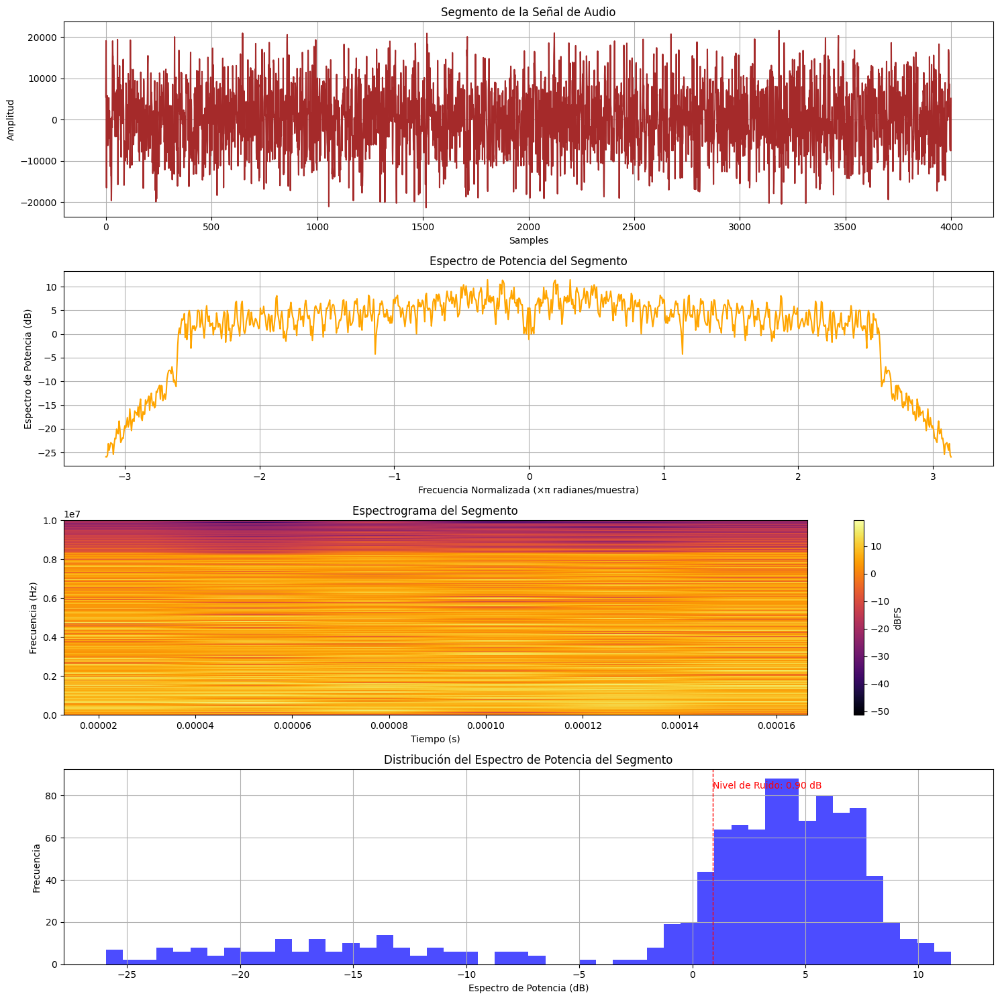

In [24]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g6M_2024-07-01T19_58_56_230.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-25-62e573c5a2da>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


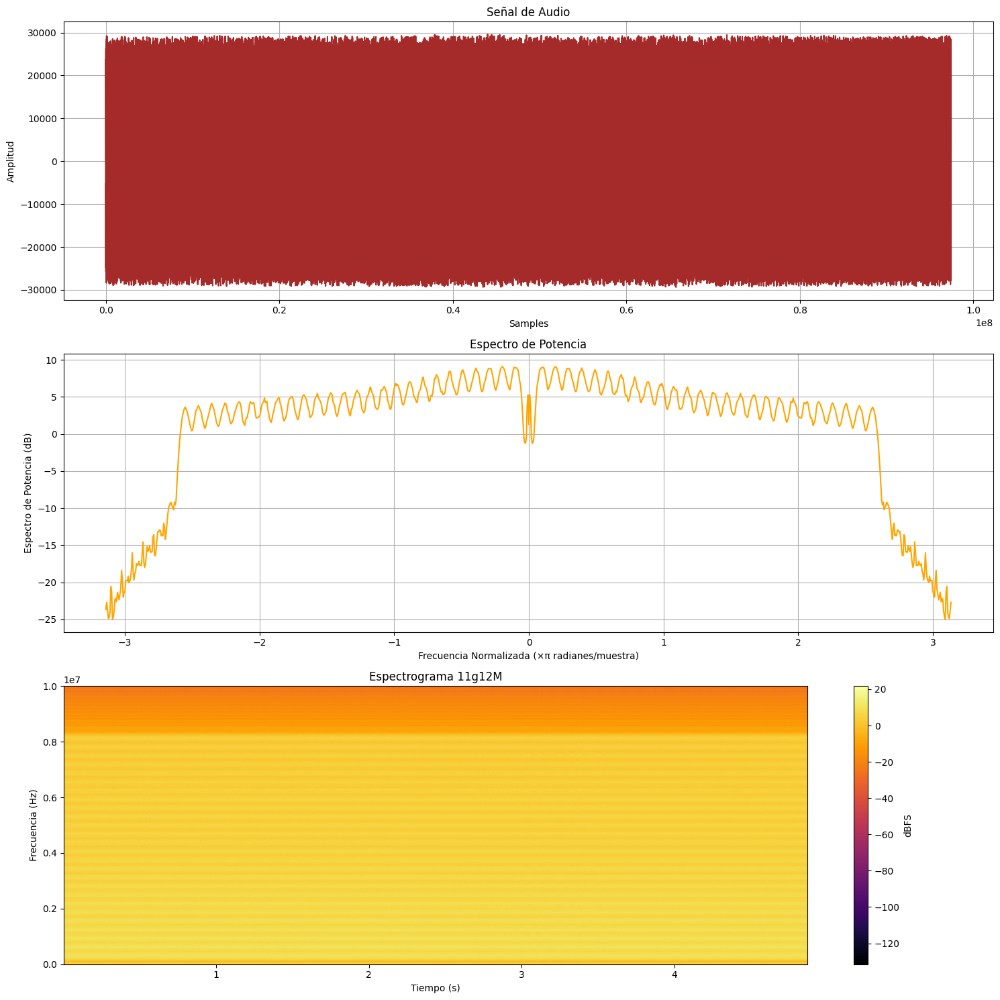

In [25]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g12M_2024-07-01T20_00_05_117.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g12M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-26-3ca1d9d88f48>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


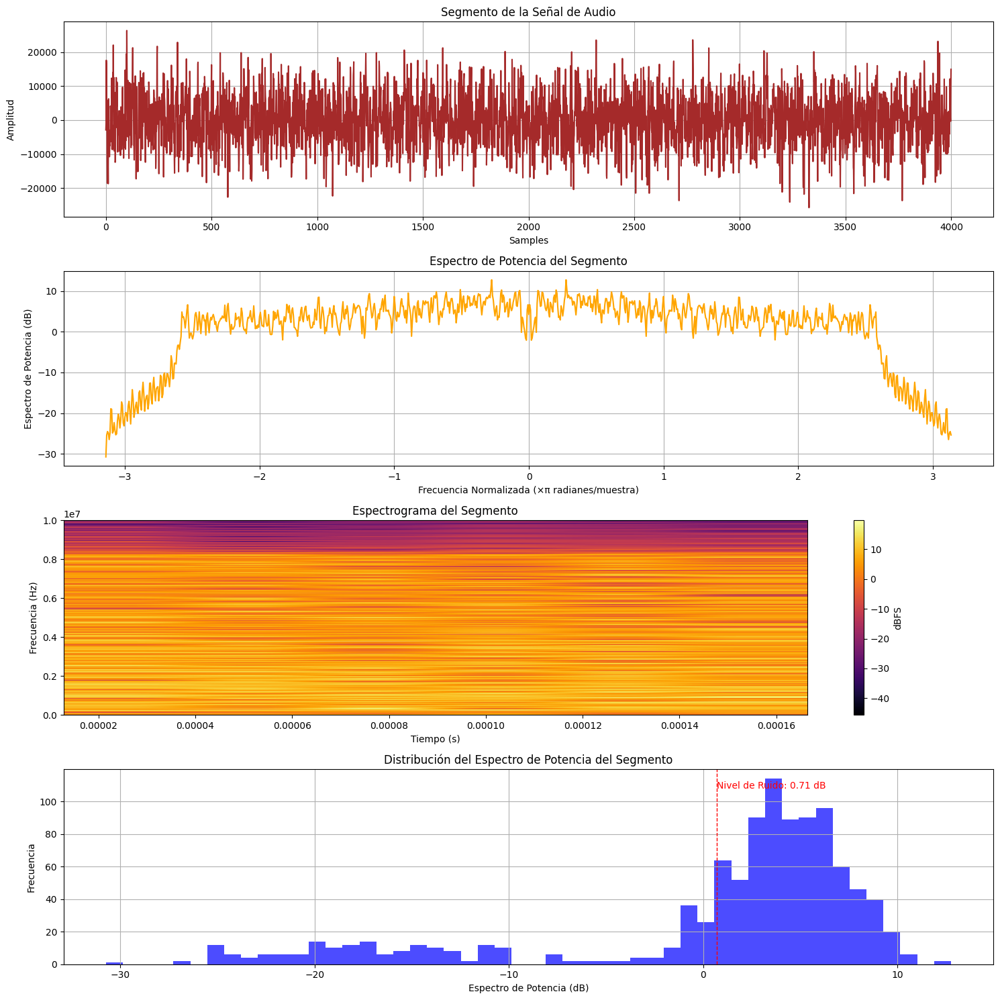

In [26]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g12M_2024-07-01T20_00_05_117.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-27-25b1d6976c97>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


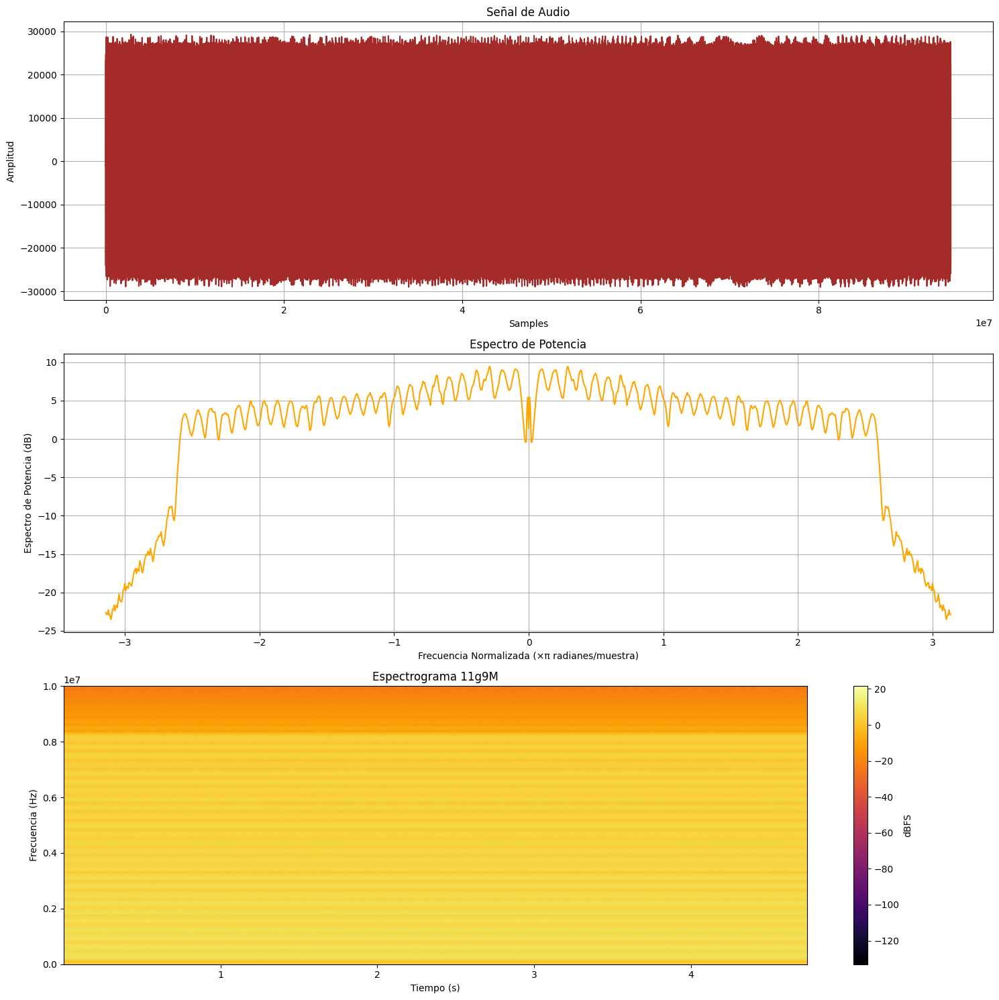

In [27]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g9M_2024-07-01T19_59_21_616.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g9M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-28-28c09cbae1f5>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


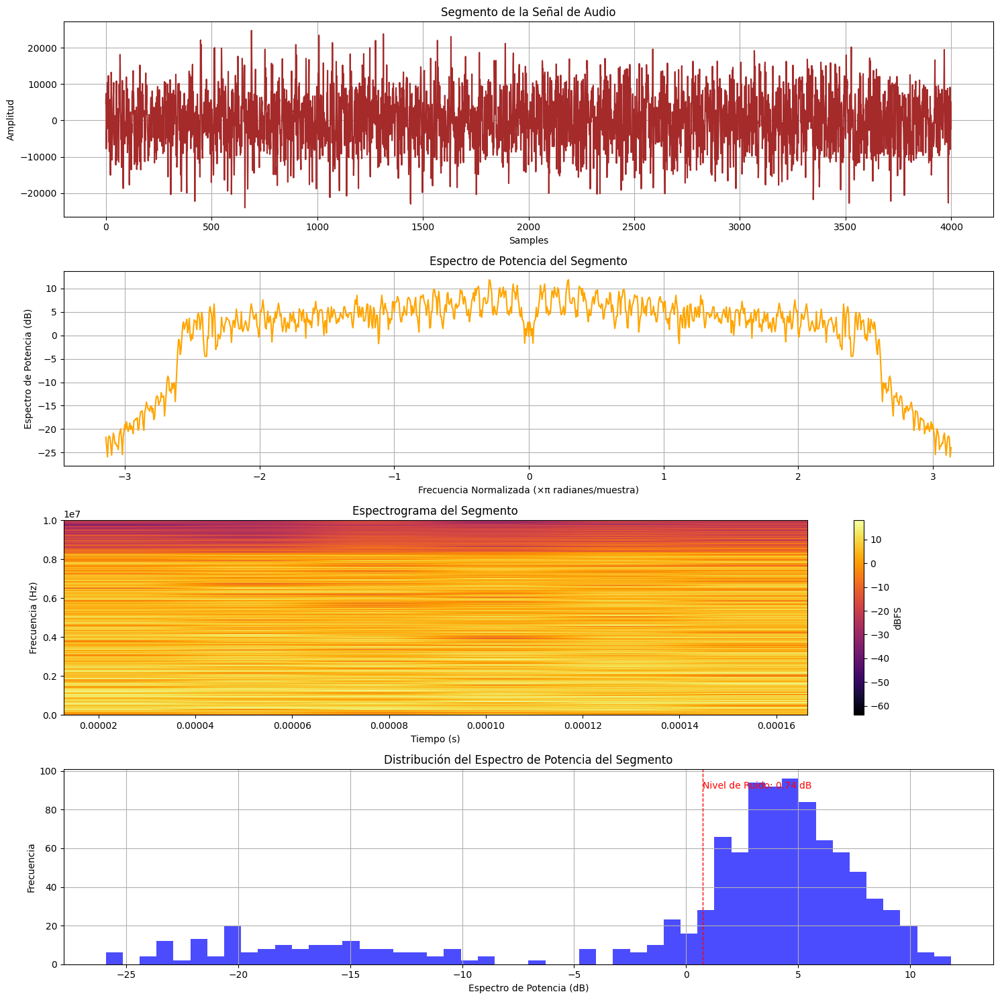

In [28]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g9M_2024-07-01T19_59_21_616.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-29-22e007c556a6>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


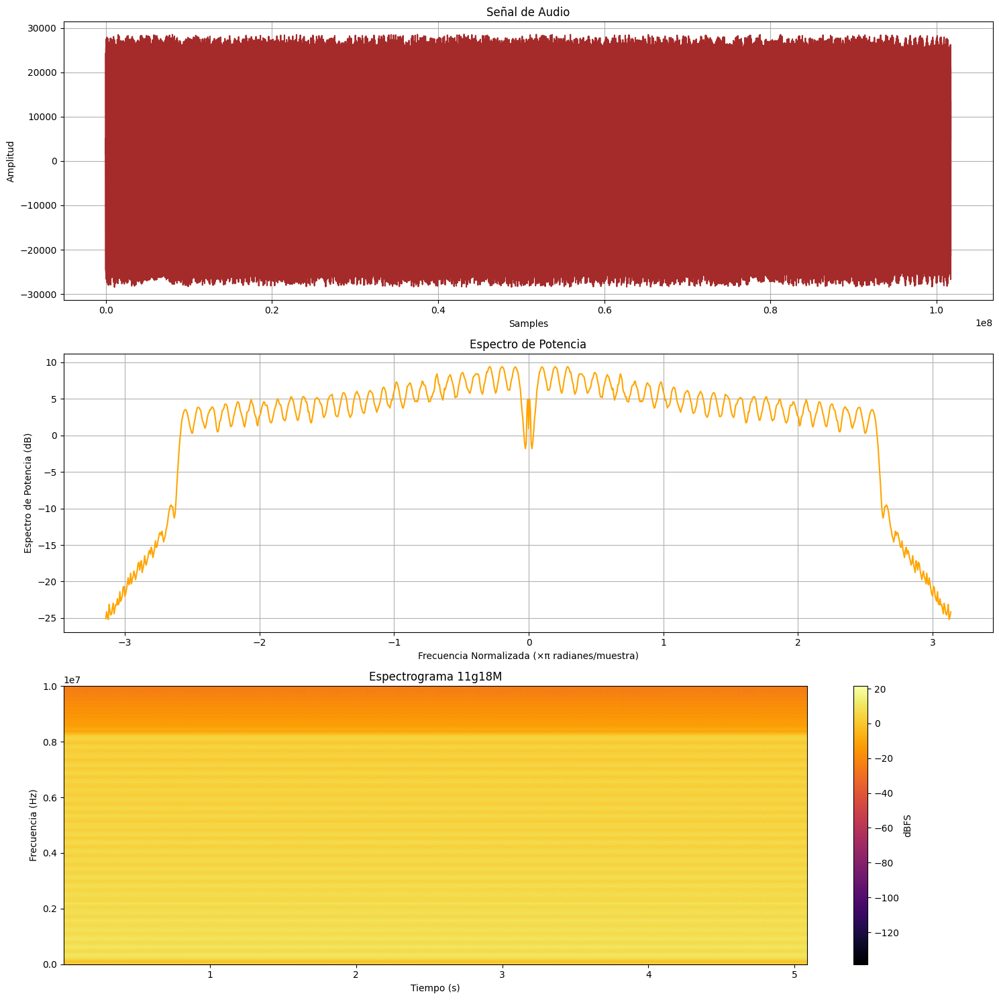

In [29]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g18M_2024-07-01T20_00_33_222.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g18M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-30-7de19483d6f3>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


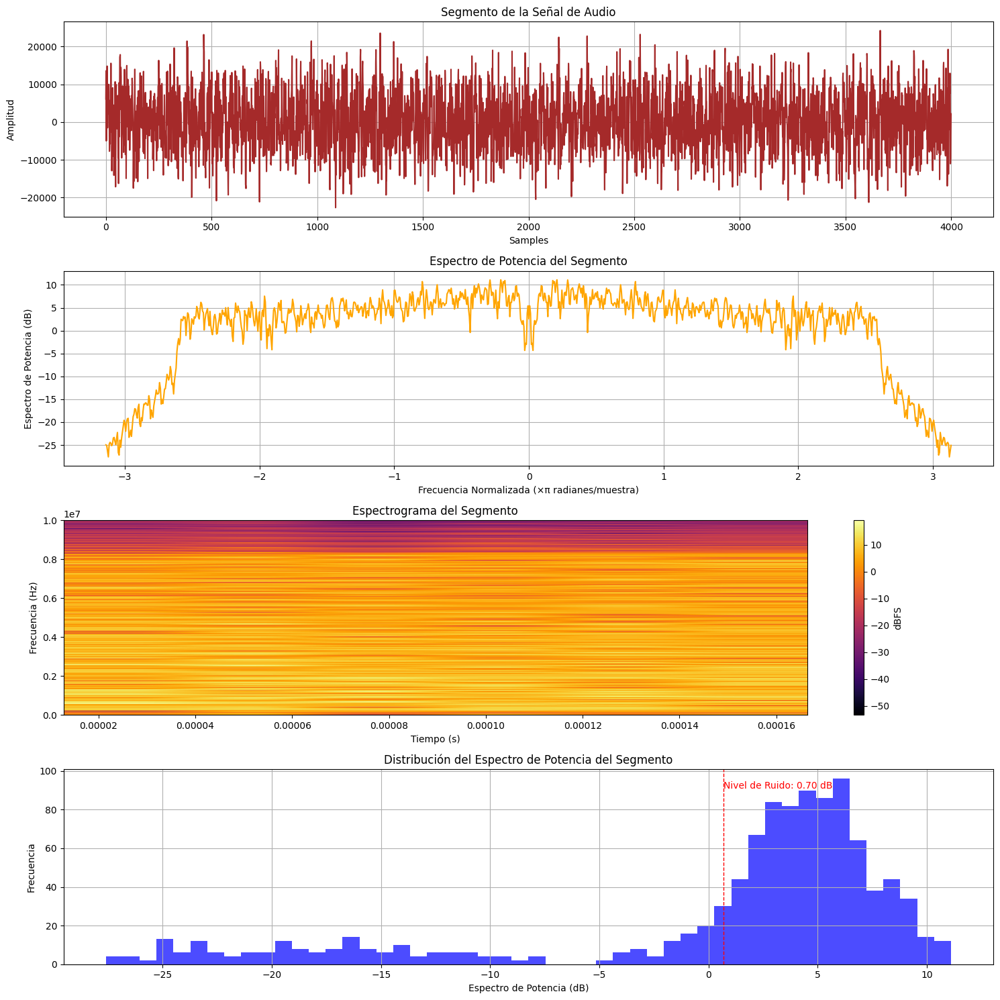

In [30]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g18M_2024-07-01T20_00_33_222.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-31-987b30084c8a>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


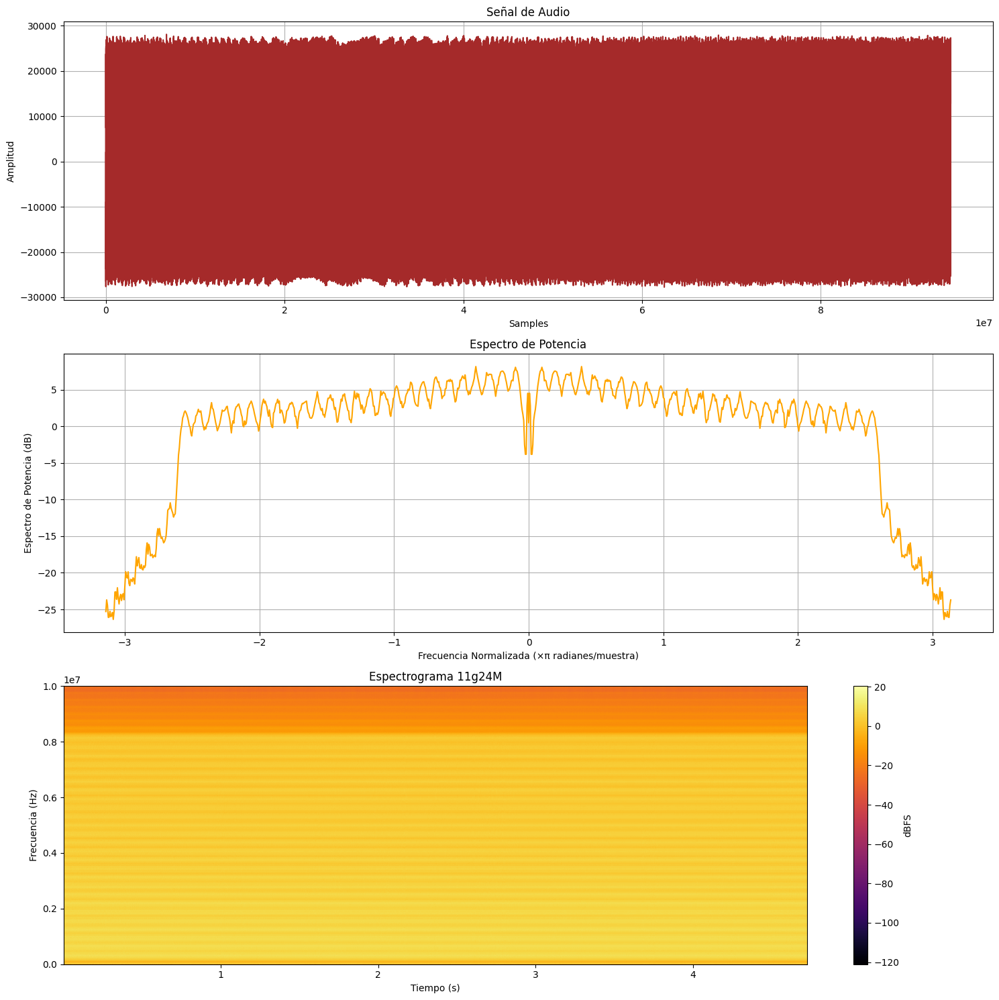

In [31]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g24M_2024-07-01T20_00_57_835.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g24M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-32-b3a4f19bb494>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


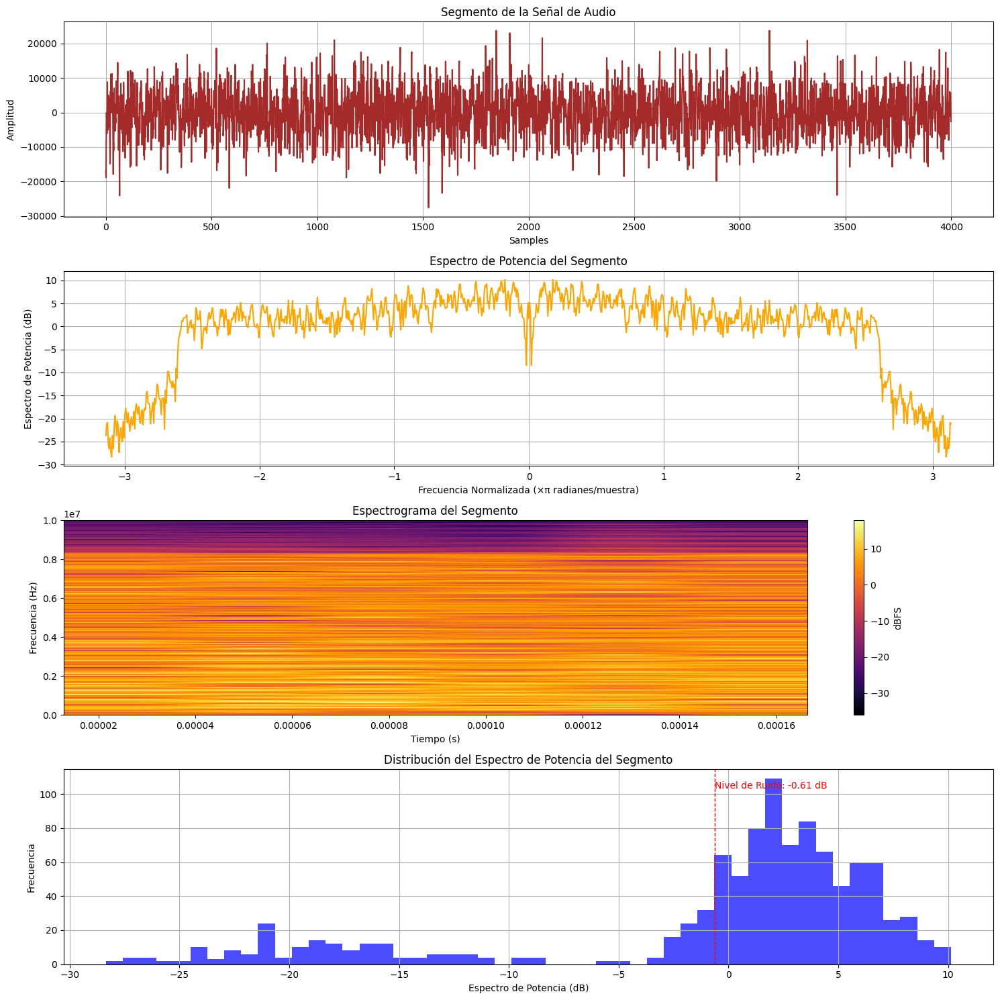

In [32]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g24M_2024-07-01T20_00_57_835.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-33-0e37b2bab19d>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


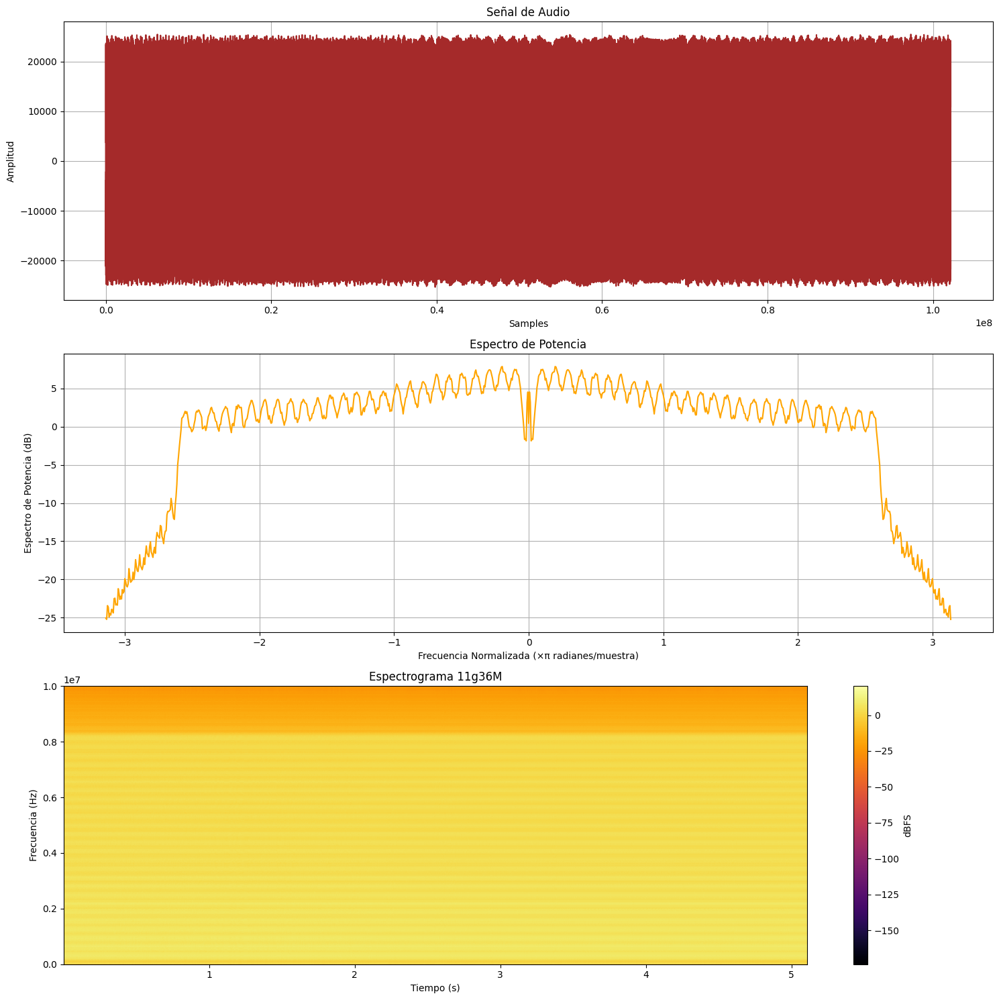

In [33]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g36M_2024-07-01T20_01_24_785.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g36M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-34-e087da991e0d>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


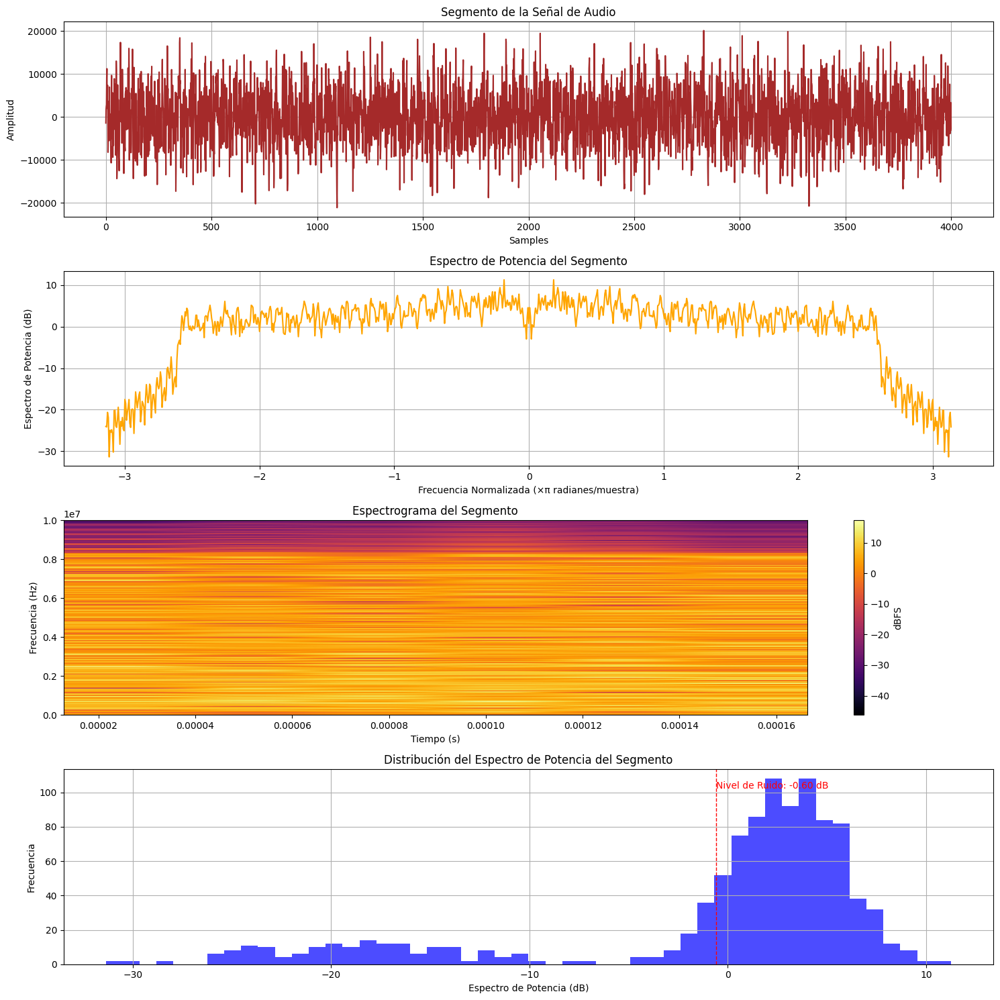

In [34]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g36M_2024-07-01T20_01_24_785.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-35-049b96e61847>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


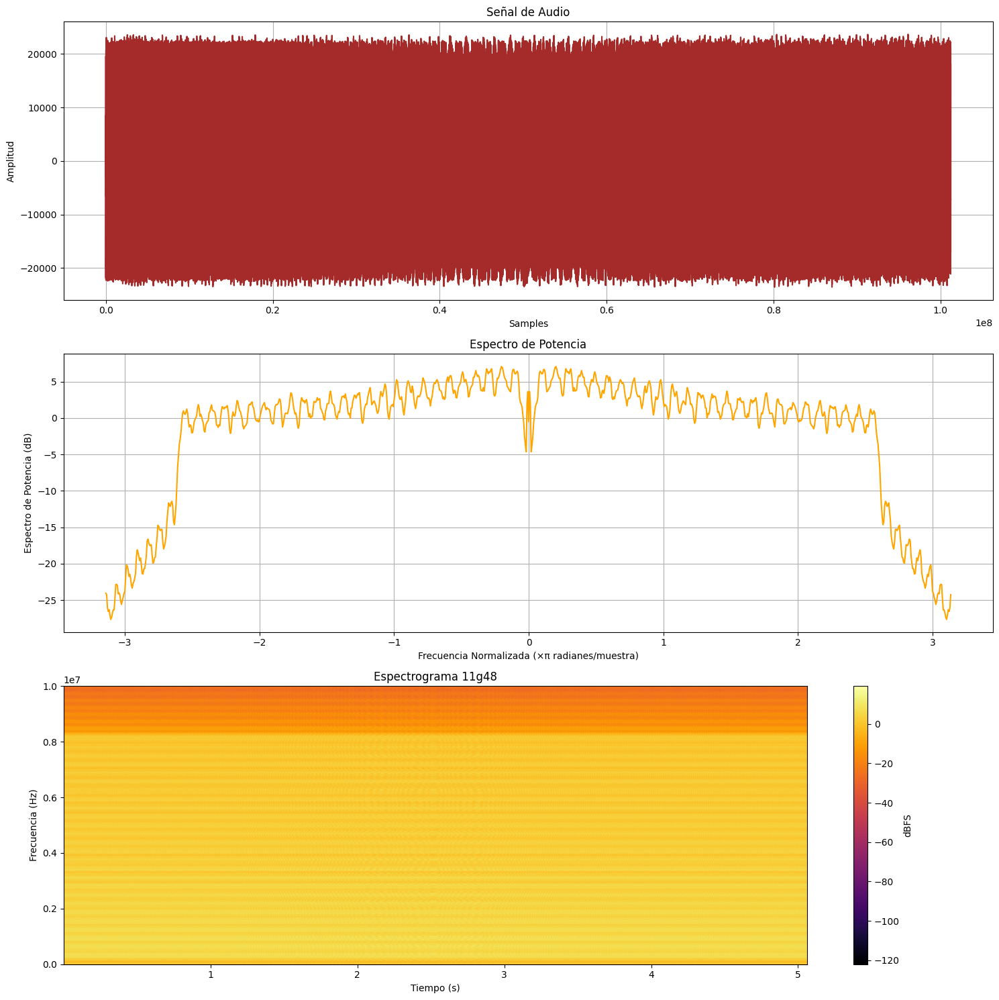

In [35]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g48M_2024-07-01T20_01_53_893.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g48')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-36-48fa080a9130>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


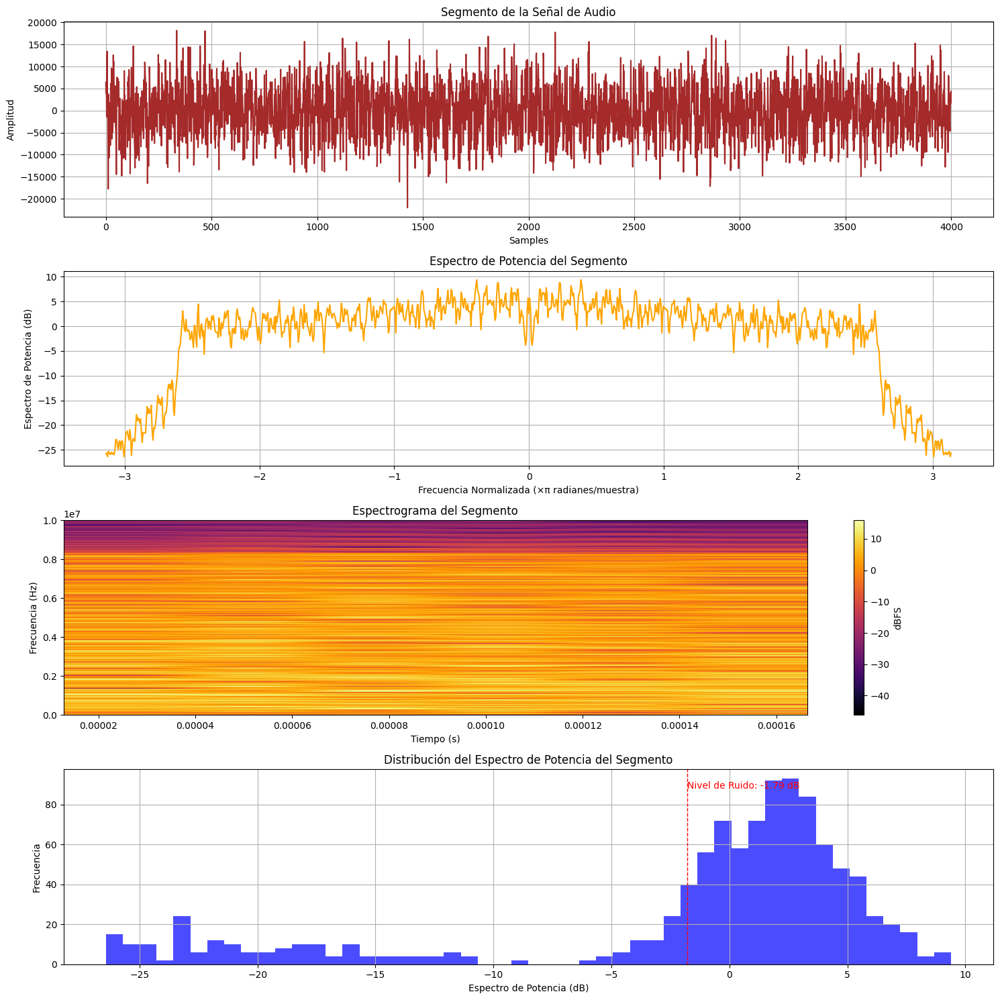

In [36]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g48M_2024-07-01T20_01_53_893.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-37-806b912db0d1>:10: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


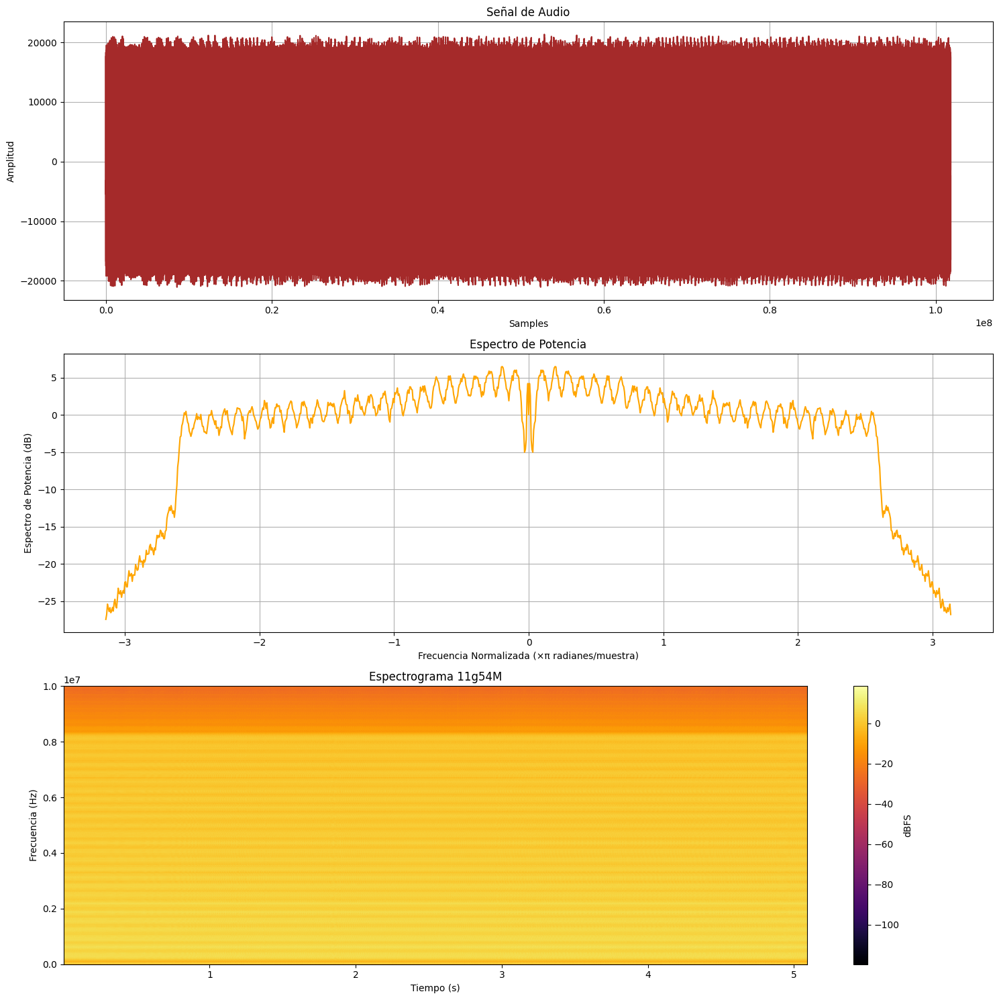

In [37]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g54M_2024-07-01T20_02_16_410.wav'

sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g54M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-38-70a7a860d4a6>:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


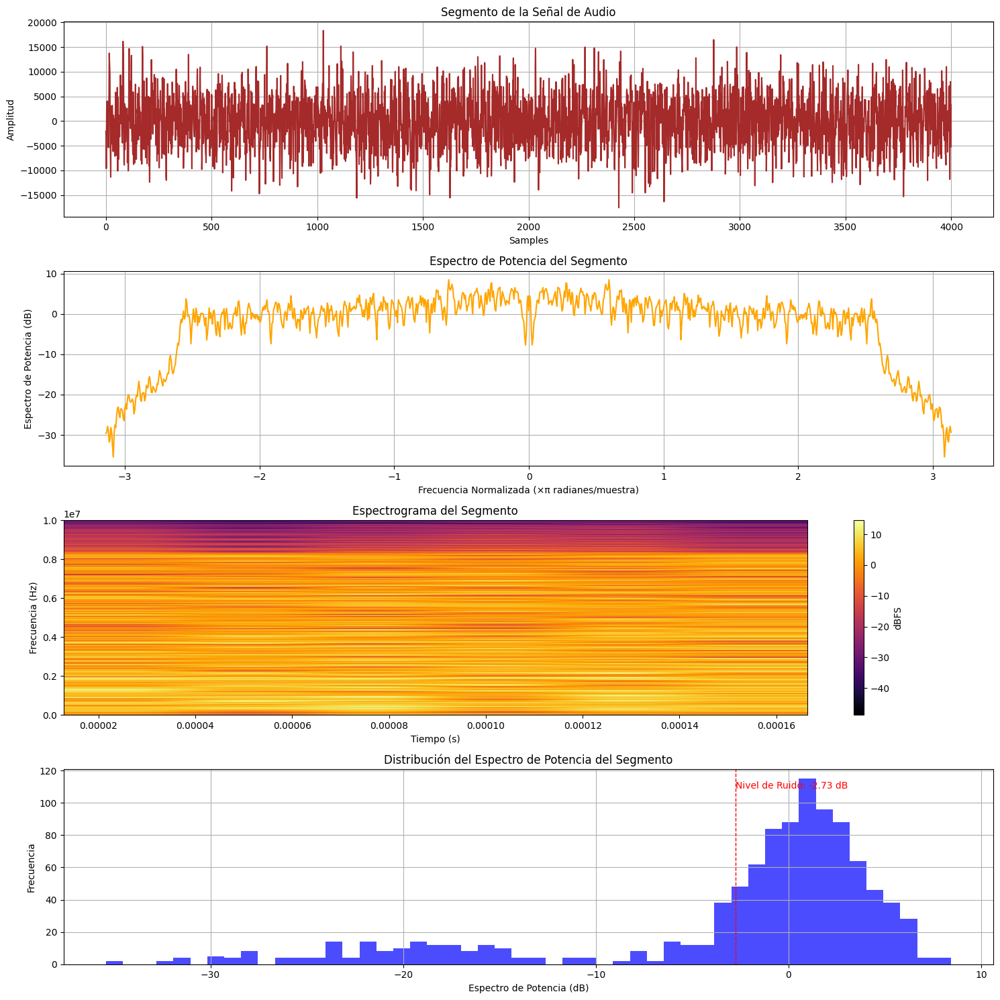

In [38]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/Grupo3SDR/11g54M_2024-07-01T20_02_16_410.wav'


sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()